<a href="https://colab.research.google.com/github/steineggerlab/colabfold-protocol/blob/main/web/notebook/ASCT2_conformation_MSADepthReduction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://raw.githubusercontent.com/sokrypton/ColabFold/main/.github/ColabFold_Marv_Logo_Small.png" height="200" align="right" style="height:240px">

##ColabFold v1.5.3: AlphaFold2 using MMseqs2

Easy to use protein structure and complex prediction using [AlphaFold2](https://www.nature.com/articles/s41586-021-03819-2) and [Alphafold2-multimer](https://www.biorxiv.org/content/10.1101/2021.10.04.463034v1). Sequence alignments/templates are generated through [MMseqs2](mmseqs.com) and [HHsearch](https://github.com/soedinglab/hh-suite). For more details, see <a href="#Instructions">bottom</a> of the notebook, checkout the [ColabFold GitHub](https://github.com/sokrypton/ColabFold) and read our manuscript.
Old versions: [v1.4](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.4.0/AlphaFold2.ipynb), [v1.5.1](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.1/AlphaFold2.ipynb), [v1.5.2](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.2/AlphaFold2.ipynb)

[Mirdita M, Schütze K, Moriwaki Y, Heo L, Ovchinnikov S, Steinegger M. ColabFold: Making protein folding accessible to all.
*Nature Methods*, 2022](https://www.nature.com/articles/s41592-022-01488-1)

-----------

### News
- <b><font color='green'>2023/07/31: The ColabFold MSA server is back to normal. It was using older DB (UniRef30 2202/PDB70 220313) from 27th ~8:30 AM CEST to 31st ~11:10 AM CEST.</font></b>
- <b><font color='green'>2023/06/12: New databases! UniRef30 updated to 2023_02 and PDB to 230517. We now use PDB100 instead of PDB70 (see [notes](#pdb100)).</font></b>
- <b><font color='green'>2023/06/12: We introduced a new default pairing strategy: Previously, for multimer predictions with more than 2 chains, we only pair if all sequences taxonomically match ("complete" pairing). The new default "greedy" strategy pairs any taxonomically matching subsets.</font></b>

In [ ]:
#@title Input protein sequence(s), then hit `Runtime` -> `Run all`
from google.colab import files
import os
import re
import hashlib
import random

from sys import version_info
python_version = f"{version_info.major}.{version_info.minor}"

def add_hash(x,y):
  return x+"_"+hashlib.sha1(y.encode()).hexdigest()[:5]

query_sequence = 'MVADPPRDSKGLAAAEPTANGGLALASIEDQGAAAGGYCGSRDQVRRCLRANLLVLLTVVAVVAGVALGLGVSGAGGALALGPERLSAFVFPGELLLRLLRMIILPLVVCSLIGGAASLDPGALGRLGAWALLFFLVTTLLASALGVGLALALQPGAASAAINASVGAAGSAENAPSKEVLDSFLDLARNIFPSNLVSAAFRSYSTTYEERNITGTRVKVPVGQEVEGMNILGLVVFAIVFGVALRKLGPEGELLIRFFNSFNEATMVLVSWIMWYAPVGIMFLVAGKIVEMEDVGLLFARLGKYILCCLLGHAIHGLLVLPLIYFLFTRKNPYRFLWGIVTPLATAFGTSSSSATLPLMMKCVEENNGVAKHISRFILPIGATVNMDGAALFQCVAAVFIAQLSQQSLDFVKIITILVTATASSVGAAGIPAGGVLTLAIILEAVNLPVDHISLILAVDWLVDRSCTVLNVEGDALGAGLLQNYVDRTESRSTEPELIQVKSELPLDPLPVPTEEGNPLLKHYRGPAGDATVASEKESVM' #@param {type:"string"}
#@markdown  - Use `:` to specify inter-protein chainbreaks for **modeling complexes** (supports homo- and hetro-oligomers). For example **PI...SK:PI...SK** for a homodimer
jobname = 'MSA depth reduction_ASCT2(PDB : 7BCQa)' #@param {type:"string"}
# number of models to use
num_relax = 0 #@param [0, 1, 5] {type:"raw"}
#@markdown - specify how many of the top ranked structures to relax using amber
template_mode = "none" #@param ["none", "pdb100","custom"]
#@markdown - `none` = no template information is used. `pdb100` = detect templates in pdb100 (see [notes](#pdb100)). `custom` - upload and search own templates (PDB or mmCIF format, see [notes](#custom_templates))

use_amber = num_relax > 0

# remove whitespaces
query_sequence = "".join(query_sequence.split())

basejobname = "".join(jobname.split())
basejobname = re.sub(r'\W+', '', basejobname)
jobname = add_hash(basejobname, query_sequence)

# check if directory with jobname exists
def check(folder):
  if os.path.exists(folder):
    return False
  else:
    return True
if not check(jobname):
  n = 0
  while not check(f"{jobname}_{n}"): n += 1
  jobname = f"{jobname}_{n}"

# make directory to save results
os.makedirs(jobname, exist_ok=True)

# save queries
queries_path = os.path.join(jobname, f"{jobname}.csv")
with open(queries_path, "w") as text_file:
  text_file.write(f"id,sequence\n{jobname},{query_sequence}")

if template_mode == "pdb100":
  use_templates = True
  custom_template_path = None
elif template_mode == "custom":
  custom_template_path = os.path.join(jobname,f"template")
  os.makedirs(custom_template_path, exist_ok=True)
  uploaded = files.upload()
  use_templates = True
  for fn in uploaded.keys():
    os.rename(fn,os.path.join(custom_template_path,fn))
else:
  custom_template_path = None
  use_templates = False

print("jobname",jobname)
print("sequence",query_sequence)
print("length",len(query_sequence.replace(":","")))



jobname MSAdepthreduction_ASCT2PDB7BCQa_9e487
sequence MVADPPRDSKGLAAAEPTANGGLALASIEDQGAAAGGYCGSRDQVRRCLRANLLVLLTVVAVVAGVALGLGVSGAGGALALGPERLSAFVFPGELLLRLLRMIILPLVVCSLIGGAASLDPGALGRLGAWALLFFLVTTLLASALGVGLALALQPGAASAAINASVGAAGSAENAPSKEVLDSFLDLARNIFPSNLVSAAFRSYSTTYEERNITGTRVKVPVGQEVEGMNILGLVVFAIVFGVALRKLGPEGELLIRFFNSFNEATMVLVSWIMWYAPVGIMFLVAGKIVEMEDVGLLFARLGKYILCCLLGHAIHGLLVLPLIYFLFTRKNPYRFLWGIVTPLATAFGTSSSSATLPLMMKCVEENNGVAKHISRFILPIGATVNMDGAALFQCVAAVFIAQLSQQSLDFVKIITILVTATASSVGAAGIPAGGVLTLAIILEAVNLPVDHISLILAVDWLVDRSCTVLNVEGDALGAGLLQNYVDRTESRSTEPELIQVKSELPLDPLPVPTEEGNPLLKHYRGPAGDATVASEKESVM
length 541


In [ ]:
#@title Install dependencies
%%time
import os
USE_AMBER = use_amber
USE_TEMPLATES = use_templates
PYTHON_VERSION = python_version

if not os.path.isfile("COLABFOLD_READY"):
  print("installing colabfold...")
  os.system("pip install -q --no-warn-conflicts 'colabfold[alphafold-minus-jax] @ git+https://github.com/sokrypton/ColabFold'")
  os.system("pip install --upgrade dm-haiku")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/colabfold colabfold")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/alphafold alphafold")
  # patch for jax > 0.3.25
  os.system("sed -i 's/weights = jax.nn.softmax(logits)/logits=jnp.clip(logits,-1e8,1e8);weights=jax.nn.softmax(logits)/g' alphafold/model/modules.py")
  os.system("touch COLABFOLD_READY")

if USE_AMBER or USE_TEMPLATES:
  if not os.path.isfile("CONDA_READY"):
    print("installing conda...")
    os.system("wget -qnc https://github.com/conda-forge/miniforge/releases/latest/download/Mambaforge-Linux-x86_64.sh")
    os.system("bash Mambaforge-Linux-x86_64.sh -bfp /usr/local")
    os.system("mamba config --set auto_update_conda false")
    os.system("touch CONDA_READY")

if USE_TEMPLATES and not os.path.isfile("HH_READY") and USE_AMBER and not os.path.isfile("AMBER_READY"):
  print("installing hhsuite and amber...")
  os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
  os.system("touch HH_READY")
  os.system("touch AMBER_READY")
else:
  if USE_TEMPLATES and not os.path.isfile("HH_READY"):
    print("installing hhsuite...")
    os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 python='{PYTHON_VERSION}'")
    os.system("touch HH_READY")
  if USE_AMBER and not os.path.isfile("AMBER_READY"):
    print("installing amber...")
    os.system(f"mamba install -y -c conda-forge openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
    os.system("touch AMBER_READY")

installing colabfold...
CPU times: user 115 ms, sys: 35.1 ms, total: 151 ms
Wall time: 38.9 s


In [ ]:
#@markdown ### MSA options (custom MSA upload, single sequence, pairing mode)
msa_mode = "mmseqs2_uniref_env" #@param ["mmseqs2_uniref_env", "mmseqs2_uniref","single_sequence","custom"]
pair_mode = "unpaired_paired" #@param ["unpaired_paired","paired","unpaired"] {type:"string"}
#@markdown - "unpaired_paired" = pair sequences from same species + unpaired MSA, "unpaired" = seperate MSA for each chain, "paired" - only use paired sequences.

# decide which a3m to use
if "mmseqs2" in msa_mode:
  a3m_file = os.path.join(jobname,f"{jobname}.a3m")

elif msa_mode == "custom":
  a3m_file = os.path.join(jobname,f"{jobname}.custom.a3m")
  if not os.path.isfile(a3m_file):
    custom_msa_dict = files.upload()
    custom_msa = list(custom_msa_dict.keys())[0]
    header = 0
    import fileinput
    for line in fileinput.FileInput(custom_msa,inplace=1):
      if line.startswith(">"):
         header = header + 1
      if not line.rstrip():
        continue
      if line.startswith(">") == False and header == 1:
         query_sequence = line.rstrip()
      print(line, end='')

    os.rename(custom_msa, a3m_file)
    queries_path=a3m_file
    print(f"moving {custom_msa} to {a3m_file}")

else:
  a3m_file = os.path.join(jobname,f"{jobname}.single_sequence.a3m")
  with open(a3m_file, "w") as text_file:
    text_file.write(">1\n%s" % query_sequence)

In [ ]:
#@markdown ### Advanced settings
model_type = "auto" #@param ["auto", "alphafold2_ptm", "alphafold2_multimer_v1", "alphafold2_multimer_v2", "alphafold2_multimer_v3"]
#@markdown - if `auto` selected, will use `alphafold2_ptm` for monomer prediction and `alphafold2_multimer_v3` for complex prediction.
#@markdown Any of the mode_types can be used (regardless if input is monomer or complex).
num_recycles = "3" #@param ["auto", "0", "1", "3", "6", "12", "24", "48"]
#@markdown - if `auto` selected, will use `num_recycles=20` if `model_type=alphafold2_multimer_v3`, else `num_recycles=3` .
recycle_early_stop_tolerance = "auto" #@param ["auto", "0.0", "0.5", "1.0"]
#@markdown - if `auto` selected, will use `tol=0.5` if `model_type=alphafold2_multimer_v3` else `tol=0.0`.
relax_max_iterations = 200 #@param [0, 200, 2000] {type:"raw"}
#@markdown - max amber relax iterations, `0` = unlimited (AlphaFold2 default, can take very long)
pairing_strategy = "greedy" #@param ["greedy", "complete"] {type:"string"}
#@markdown - `greedy` = pair any taxonomically matching subsets, `complete` = all sequences have to match in one line.


#@markdown #### Sample settings
#@markdown -  enable dropouts and increase number of seeds to sample predictions from uncertainty of the model.
#@markdown -  decrease `max_msa` to increase uncertainity
max_msa = "32:64" #@param ["auto", "512:1024", "256:512", "64:128", "32:64", "16:32"]
num_seeds = 16 #@param [1,2,4,8,16] {type:"raw"}
use_dropout = False #@param {type:"boolean"}

num_recycles = None if num_recycles == "auto" else int(num_recycles)
recycle_early_stop_tolerance = None if recycle_early_stop_tolerance == "auto" else float(recycle_early_stop_tolerance)
if max_msa == "auto": max_msa = None

#@markdown #### Save settings
save_all = False #@param {type:"boolean"}
save_recycles = False #@param {type:"boolean"}
save_to_google_drive = False #@param {type:"boolean"}
#@markdown -  if the save_to_google_drive option was selected, the result zip will be uploaded to your Google Drive
dpi = 200 #@param {type:"integer"}
#@markdown - set dpi for image resolution

if save_to_google_drive:
  from pydrive.drive import GoogleDrive
  from pydrive.auth import GoogleAuth
  from google.colab import auth
  from oauth2client.client import GoogleCredentials
  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)
  print("You are logged into Google Drive and are good to go!")

#@markdown Don't forget to hit `Runtime` -> `Run all` after updating the form.

2023-11-09 07:30:46,512 Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA
2023-11-09 07:30:46,514 Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2023-11-09 07:30:48,591 Running on GPU
2023-11-09 07:30:48,698 Found 4 citations for tools or databases
2023-11-09 07:30:48,698 Query 1/1: MSAdepthreduction_ASCT2PDB7BCQa_9e487 (length 541)


COMPLETE: 100%|██████████| 150/150 [elapsed: 00:01 remaining: 00:00]


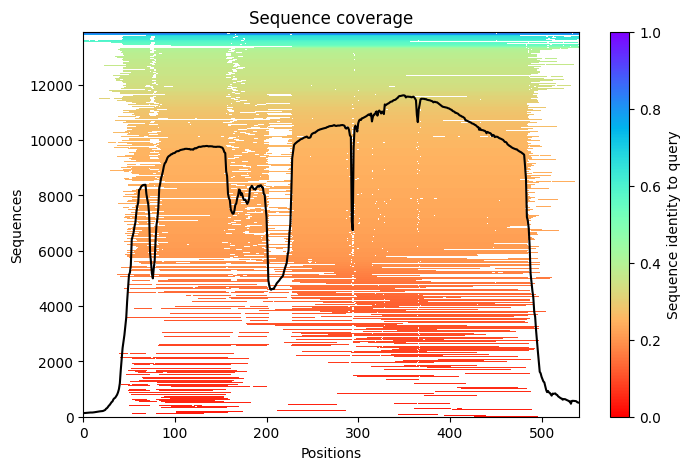

2023-11-09 07:30:54,190 Setting max_seq=32, max_extra_seq=64
2023-11-09 07:32:01,271 alphafold2_ptm_model_1_seed_000 recycle=0 pLDDT=65.9 pTM=0.629
2023-11-09 07:32:07,036 alphafold2_ptm_model_1_seed_000 recycle=1 pLDDT=68.7 pTM=0.653 tol=6.34
2023-11-09 07:32:12,799 alphafold2_ptm_model_1_seed_000 recycle=2 pLDDT=69.5 pTM=0.655 tol=4.23
2023-11-09 07:32:18,566 alphafold2_ptm_model_1_seed_000 recycle=3 pLDDT=70.6 pTM=0.683 tol=2.71
2023-11-09 07:32:18,567 alphafold2_ptm_model_1_seed_000 took 64.2s (3 recycles)


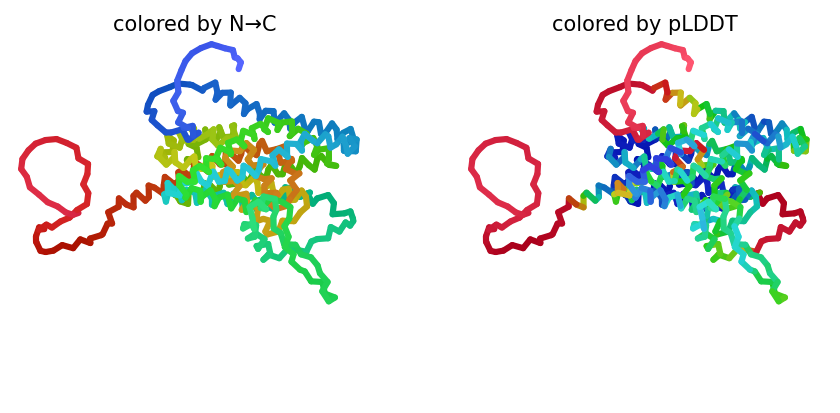

2023-11-09 07:32:24,994 alphafold2_ptm_model_2_seed_000 recycle=0 pLDDT=69.9 pTM=0.688
2023-11-09 07:32:30,797 alphafold2_ptm_model_2_seed_000 recycle=1 pLDDT=70.9 pTM=0.692 tol=5.59
2023-11-09 07:32:36,638 alphafold2_ptm_model_2_seed_000 recycle=2 pLDDT=71.2 pTM=0.695 tol=2.57
2023-11-09 07:32:42,439 alphafold2_ptm_model_2_seed_000 recycle=3 pLDDT=70.6 pTM=0.687 tol=1.13
2023-11-09 07:32:42,441 alphafold2_ptm_model_2_seed_000 took 23.3s (3 recycles)


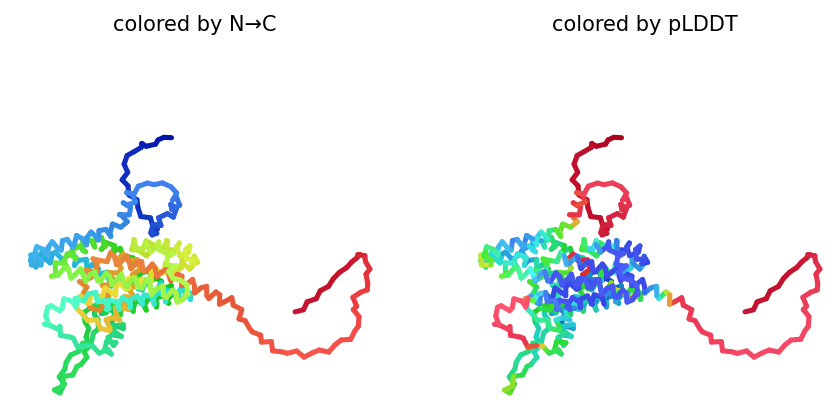

2023-11-09 07:32:48,834 alphafold2_ptm_model_3_seed_000 recycle=0 pLDDT=70.8 pTM=0.679
2023-11-09 07:32:54,642 alphafold2_ptm_model_3_seed_000 recycle=1 pLDDT=72.9 pTM=0.698 tol=3.52
2023-11-09 07:33:00,478 alphafold2_ptm_model_3_seed_000 recycle=2 pLDDT=73.7 pTM=0.722 tol=1.9
2023-11-09 07:33:06,280 alphafold2_ptm_model_3_seed_000 recycle=3 pLDDT=73.6 pTM=0.719 tol=0.943
2023-11-09 07:33:06,281 alphafold2_ptm_model_3_seed_000 took 23.3s (3 recycles)


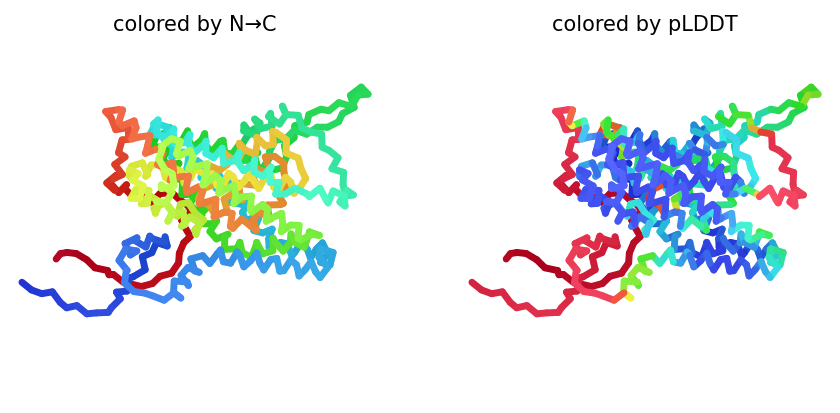

2023-11-09 07:33:12,681 alphafold2_ptm_model_4_seed_000 recycle=0 pLDDT=69.5 pTM=0.67
2023-11-09 07:33:18,479 alphafold2_ptm_model_4_seed_000 recycle=1 pLDDT=73.1 pTM=0.719 tol=4.03
2023-11-09 07:33:24,293 alphafold2_ptm_model_4_seed_000 recycle=2 pLDDT=73.2 pTM=0.723 tol=1.82
2023-11-09 07:33:30,095 alphafold2_ptm_model_4_seed_000 recycle=3 pLDDT=74.2 pTM=0.737 tol=1.49
2023-11-09 07:33:30,097 alphafold2_ptm_model_4_seed_000 took 23.2s (3 recycles)


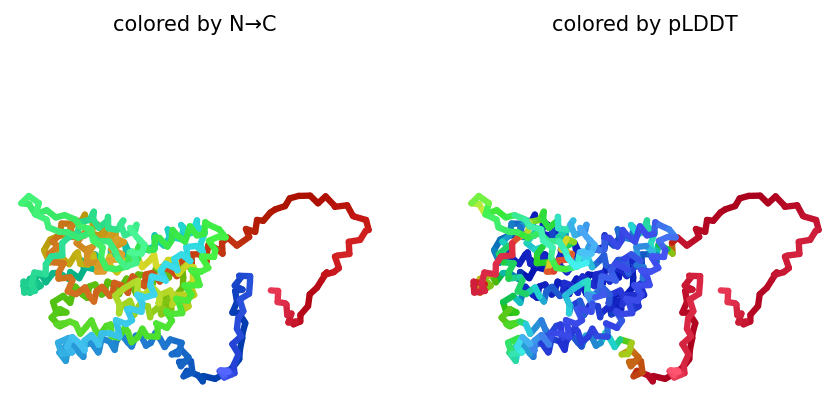

2023-11-09 07:33:36,730 alphafold2_ptm_model_5_seed_000 recycle=0 pLDDT=67.8 pTM=0.623
2023-11-09 07:33:42,569 alphafold2_ptm_model_5_seed_000 recycle=1 pLDDT=74.2 pTM=0.738 tol=6.7
2023-11-09 07:33:48,415 alphafold2_ptm_model_5_seed_000 recycle=2 pLDDT=75.3 pTM=0.752 tol=2.31
2023-11-09 07:33:54,239 alphafold2_ptm_model_5_seed_000 recycle=3 pLDDT=74.6 pTM=0.739 tol=2.71
2023-11-09 07:33:54,241 alphafold2_ptm_model_5_seed_000 took 23.3s (3 recycles)


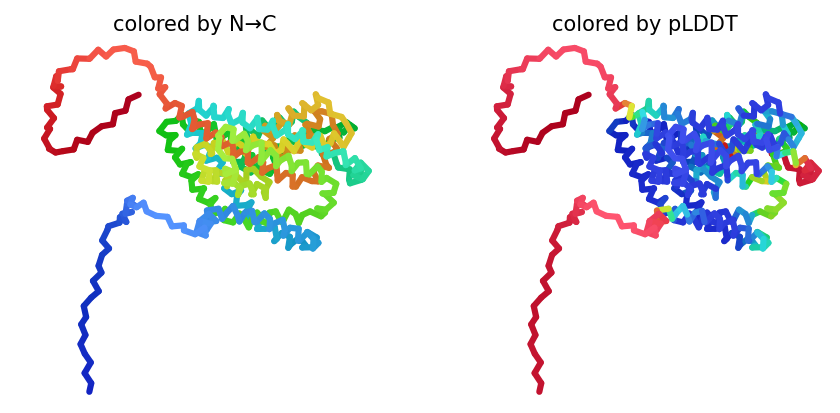

2023-11-09 07:34:04,522 alphafold2_ptm_model_1_seed_001 recycle=0 pLDDT=67.2 pTM=0.617
2023-11-09 07:34:10,358 alphafold2_ptm_model_1_seed_001 recycle=1 pLDDT=70.3 pTM=0.675 tol=4.21
2023-11-09 07:34:16,130 alphafold2_ptm_model_1_seed_001 recycle=2 pLDDT=70.9 pTM=0.688 tol=2.61
2023-11-09 07:34:21,955 alphafold2_ptm_model_1_seed_001 recycle=3 pLDDT=69.8 pTM=0.662 tol=2.16
2023-11-09 07:34:21,956 alphafold2_ptm_model_1_seed_001 took 23.2s (3 recycles)


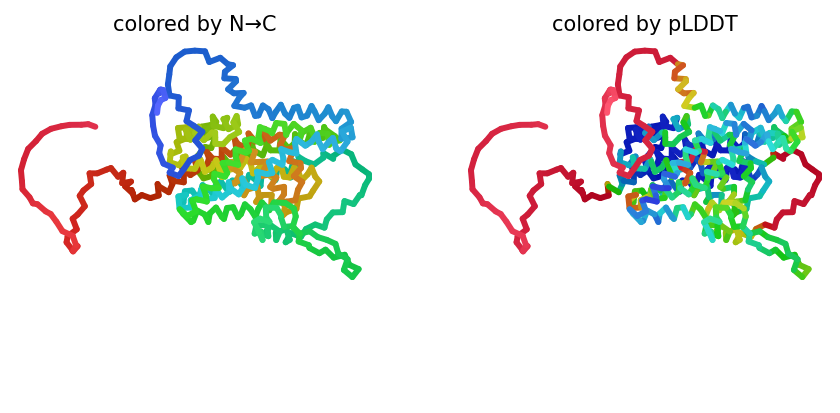

2023-11-09 07:34:28,387 alphafold2_ptm_model_2_seed_001 recycle=0 pLDDT=64.2 pTM=0.566
2023-11-09 07:34:34,242 alphafold2_ptm_model_2_seed_001 recycle=1 pLDDT=66.2 pTM=0.605 tol=5.7
2023-11-09 07:34:40,031 alphafold2_ptm_model_2_seed_001 recycle=2 pLDDT=68.8 pTM=0.663 tol=3
2023-11-09 07:34:45,882 alphafold2_ptm_model_2_seed_001 recycle=3 pLDDT=69.3 pTM=0.654 tol=1.67
2023-11-09 07:34:45,883 alphafold2_ptm_model_2_seed_001 took 23.3s (3 recycles)


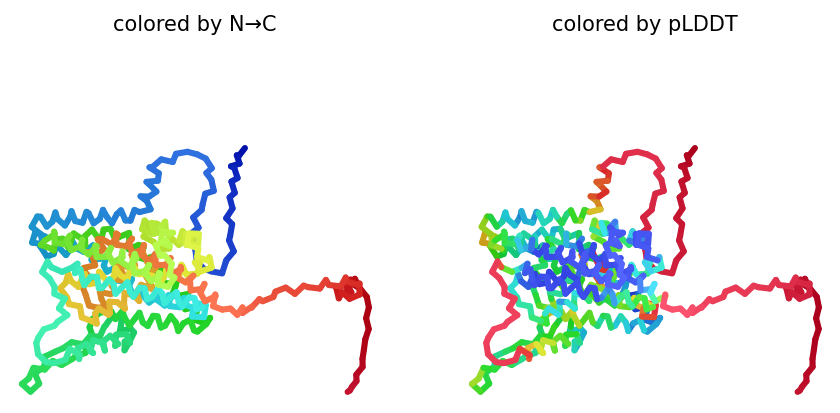

2023-11-09 07:34:52,281 alphafold2_ptm_model_3_seed_001 recycle=0 pLDDT=72.6 pTM=0.715
2023-11-09 07:34:58,165 alphafold2_ptm_model_3_seed_001 recycle=1 pLDDT=77.2 pTM=0.766 tol=4.41
2023-11-09 07:35:03,989 alphafold2_ptm_model_3_seed_001 recycle=2 pLDDT=76.9 pTM=0.759 tol=2.24
2023-11-09 07:35:09,878 alphafold2_ptm_model_3_seed_001 recycle=3 pLDDT=77.6 pTM=0.761 tol=1.34
2023-11-09 07:35:09,879 alphafold2_ptm_model_3_seed_001 took 23.4s (3 recycles)


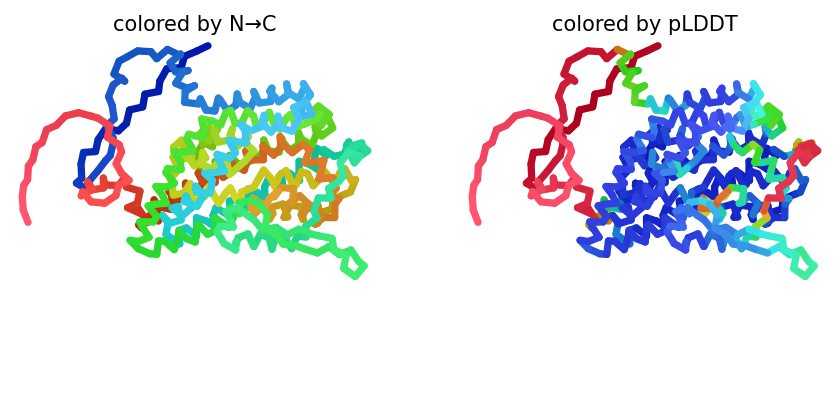

2023-11-09 07:35:16,308 alphafold2_ptm_model_4_seed_001 recycle=0 pLDDT=69.1 pTM=0.679
2023-11-09 07:35:22,157 alphafold2_ptm_model_4_seed_001 recycle=1 pLDDT=73.7 pTM=0.738 tol=4.25
2023-11-09 07:35:28,007 alphafold2_ptm_model_4_seed_001 recycle=2 pLDDT=75.1 pTM=0.747 tol=1.9
2023-11-09 07:35:33,856 alphafold2_ptm_model_4_seed_001 recycle=3 pLDDT=75.3 pTM=0.747 tol=0.881
2023-11-09 07:35:33,857 alphafold2_ptm_model_4_seed_001 took 23.4s (3 recycles)


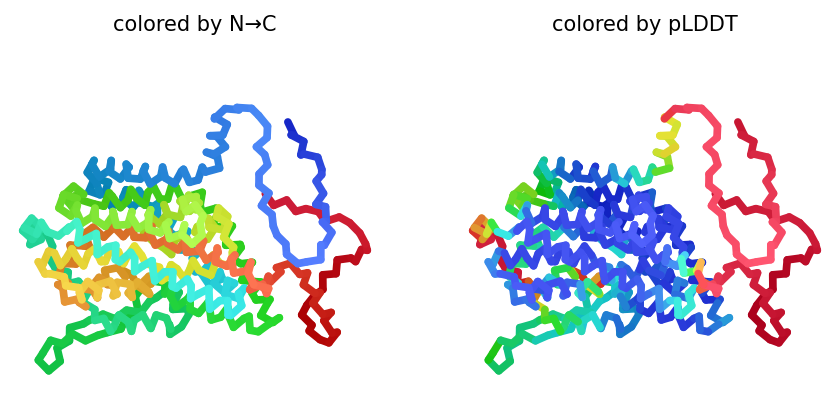

2023-11-09 07:35:40,309 alphafold2_ptm_model_5_seed_001 recycle=0 pLDDT=71.1 pTM=0.708
2023-11-09 07:35:46,196 alphafold2_ptm_model_5_seed_001 recycle=1 pLDDT=74.9 pTM=0.761 tol=3.12
2023-11-09 07:35:52,071 alphafold2_ptm_model_5_seed_001 recycle=2 pLDDT=75.6 pTM=0.76 tol=1.91
2023-11-09 07:35:57,959 alphafold2_ptm_model_5_seed_001 recycle=3 pLDDT=76 pTM=0.759 tol=1.25
2023-11-09 07:35:57,960 alphafold2_ptm_model_5_seed_001 took 23.5s (3 recycles)


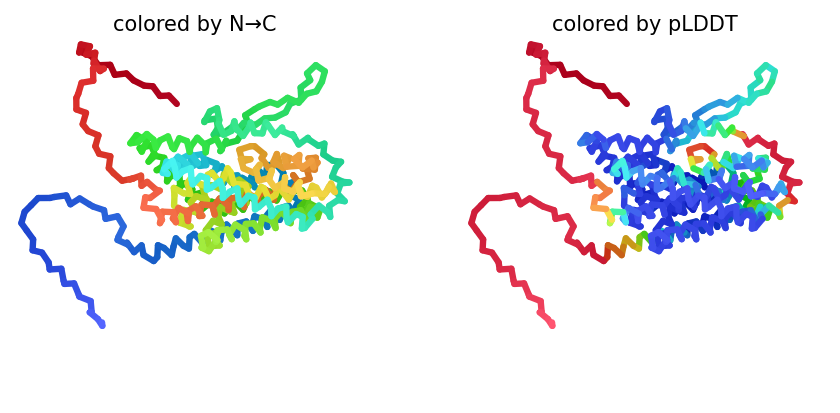

2023-11-09 07:36:08,302 alphafold2_ptm_model_1_seed_002 recycle=0 pLDDT=68.2 pTM=0.607
2023-11-09 07:36:14,125 alphafold2_ptm_model_1_seed_002 recycle=1 pLDDT=68.8 pTM=0.638 tol=7.15
2023-11-09 07:36:19,934 alphafold2_ptm_model_1_seed_002 recycle=2 pLDDT=68 pTM=0.632 tol=2.56
2023-11-09 07:36:25,753 alphafold2_ptm_model_1_seed_002 recycle=3 pLDDT=66.7 pTM=0.594 tol=4.88
2023-11-09 07:36:25,754 alphafold2_ptm_model_1_seed_002 took 23.3s (3 recycles)


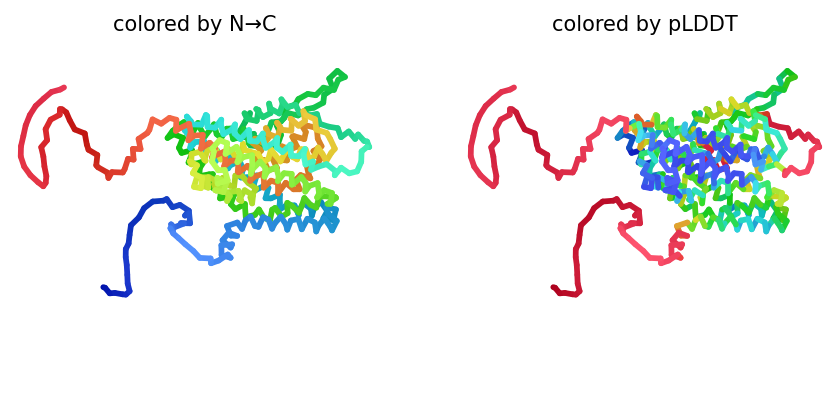

2023-11-09 07:36:32,225 alphafold2_ptm_model_2_seed_002 recycle=0 pLDDT=69.8 pTM=0.665
2023-11-09 07:36:38,080 alphafold2_ptm_model_2_seed_002 recycle=1 pLDDT=71.1 pTM=0.694 tol=7.07
2023-11-09 07:36:43,910 alphafold2_ptm_model_2_seed_002 recycle=2 pLDDT=69.7 pTM=0.654 tol=2.3
2023-11-09 07:36:49,762 alphafold2_ptm_model_2_seed_002 recycle=3 pLDDT=70.6 pTM=0.675 tol=1.5
2023-11-09 07:36:49,763 alphafold2_ptm_model_2_seed_002 took 23.4s (3 recycles)


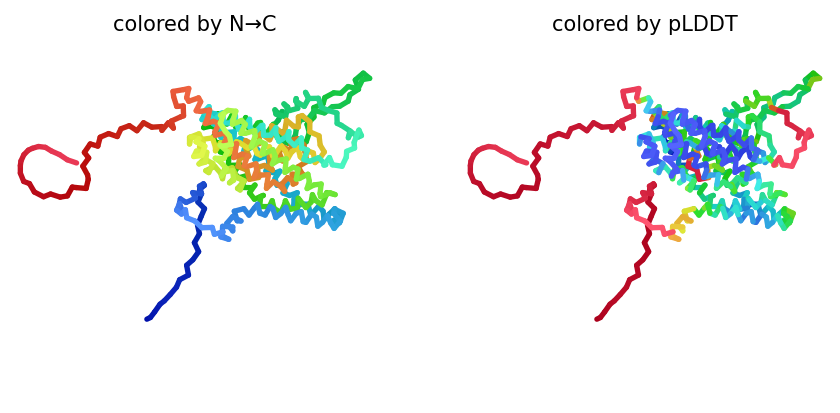

2023-11-09 07:36:56,217 alphafold2_ptm_model_3_seed_002 recycle=0 pLDDT=72.8 pTM=0.7
2023-11-09 07:37:02,129 alphafold2_ptm_model_3_seed_002 recycle=1 pLDDT=76.9 pTM=0.756 tol=3.86
2023-11-09 07:37:07,998 alphafold2_ptm_model_3_seed_002 recycle=2 pLDDT=76.8 pTM=0.748 tol=1.3
2023-11-09 07:37:13,900 alphafold2_ptm_model_3_seed_002 recycle=3 pLDDT=78.1 pTM=0.757 tol=1.26
2023-11-09 07:37:13,902 alphafold2_ptm_model_3_seed_002 took 23.5s (3 recycles)


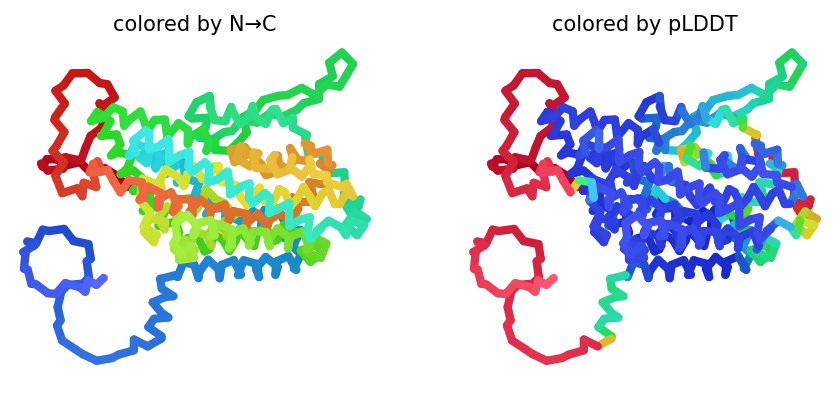

2023-11-09 07:37:20,362 alphafold2_ptm_model_4_seed_002 recycle=0 pLDDT=73.2 pTM=0.718
2023-11-09 07:37:26,220 alphafold2_ptm_model_4_seed_002 recycle=1 pLDDT=73.6 pTM=0.731 tol=4.86
2023-11-09 07:37:32,077 alphafold2_ptm_model_4_seed_002 recycle=2 pLDDT=74.6 pTM=0.733 tol=0.975
2023-11-09 07:37:37,961 alphafold2_ptm_model_4_seed_002 recycle=3 pLDDT=76.1 pTM=0.746 tol=1.29
2023-11-09 07:37:37,962 alphafold2_ptm_model_4_seed_002 took 23.5s (3 recycles)


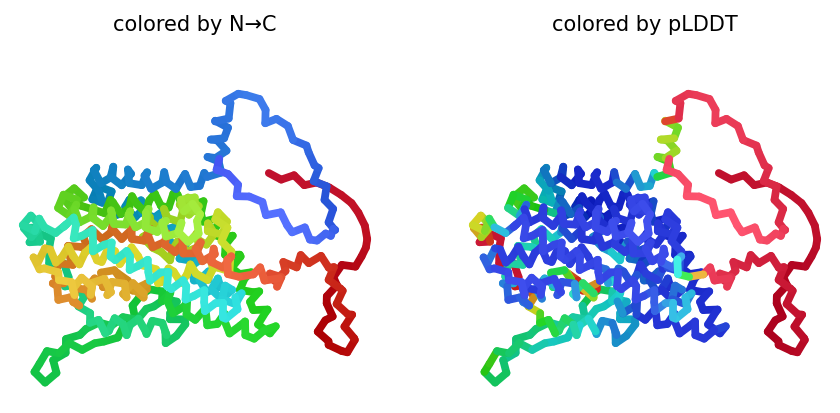

2023-11-09 07:37:44,459 alphafold2_ptm_model_5_seed_002 recycle=0 pLDDT=73.9 pTM=0.738
2023-11-09 07:37:50,353 alphafold2_ptm_model_5_seed_002 recycle=1 pLDDT=75.2 pTM=0.751 tol=4.09
2023-11-09 07:37:56,252 alphafold2_ptm_model_5_seed_002 recycle=2 pLDDT=75.8 pTM=0.753 tol=3.23
2023-11-09 07:38:02,168 alphafold2_ptm_model_5_seed_002 recycle=3 pLDDT=76.6 pTM=0.758 tol=1.93
2023-11-09 07:38:02,169 alphafold2_ptm_model_5_seed_002 took 23.6s (3 recycles)


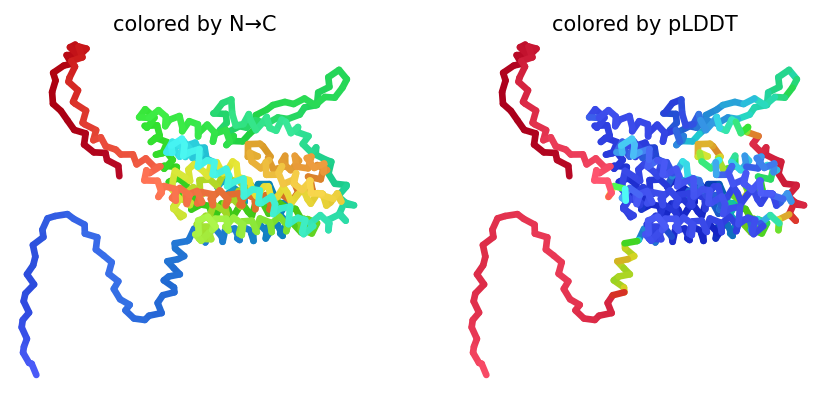

2023-11-09 07:38:12,541 alphafold2_ptm_model_1_seed_003 recycle=0 pLDDT=67.6 pTM=0.595
2023-11-09 07:38:18,352 alphafold2_ptm_model_1_seed_003 recycle=1 pLDDT=68 pTM=0.622 tol=3.68
2023-11-09 07:38:24,162 alphafold2_ptm_model_1_seed_003 recycle=2 pLDDT=68.9 pTM=0.66 tol=2.37
2023-11-09 07:38:29,976 alphafold2_ptm_model_1_seed_003 recycle=3 pLDDT=68.2 pTM=0.646 tol=1.83
2023-11-09 07:38:29,977 alphafold2_ptm_model_1_seed_003 took 23.3s (3 recycles)


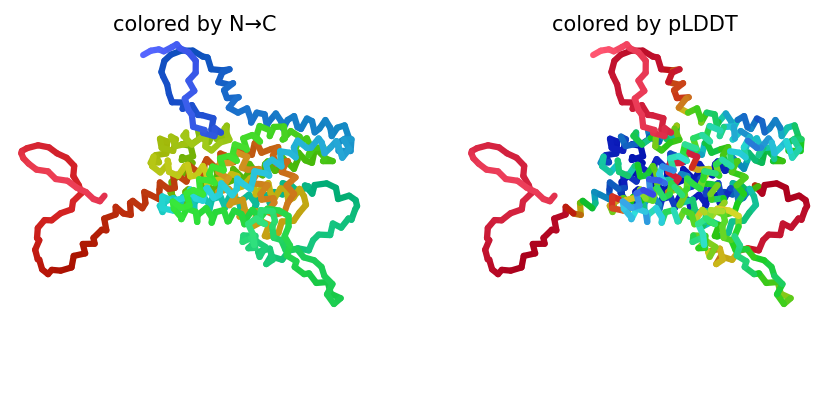

2023-11-09 07:38:36,449 alphafold2_ptm_model_2_seed_003 recycle=0 pLDDT=69.3 pTM=0.65
2023-11-09 07:38:42,292 alphafold2_ptm_model_2_seed_003 recycle=1 pLDDT=71.6 pTM=0.699 tol=4.77
2023-11-09 07:38:48,138 alphafold2_ptm_model_2_seed_003 recycle=2 pLDDT=71.1 pTM=0.693 tol=2.21
2023-11-09 07:38:53,980 alphafold2_ptm_model_2_seed_003 recycle=3 pLDDT=70.8 pTM=0.685 tol=1.64
2023-11-09 07:38:53,981 alphafold2_ptm_model_2_seed_003 took 23.4s (3 recycles)


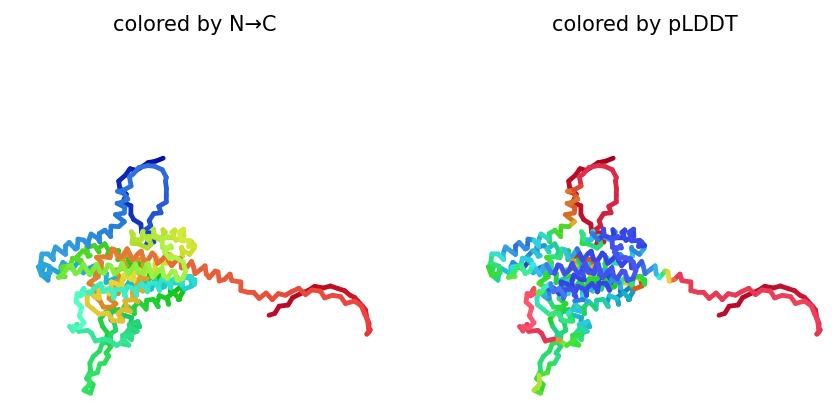

2023-11-09 07:39:00,437 alphafold2_ptm_model_3_seed_003 recycle=0 pLDDT=71.3 pTM=0.667
2023-11-09 07:39:06,287 alphafold2_ptm_model_3_seed_003 recycle=1 pLDDT=73.4 pTM=0.689 tol=3.72
2023-11-09 07:39:12,190 alphafold2_ptm_model_3_seed_003 recycle=2 pLDDT=77.9 pTM=0.764 tol=2.24
2023-11-09 07:39:18,073 alphafold2_ptm_model_3_seed_003 recycle=3 pLDDT=77.4 pTM=0.752 tol=1.52
2023-11-09 07:39:18,074 alphafold2_ptm_model_3_seed_003 took 23.5s (3 recycles)


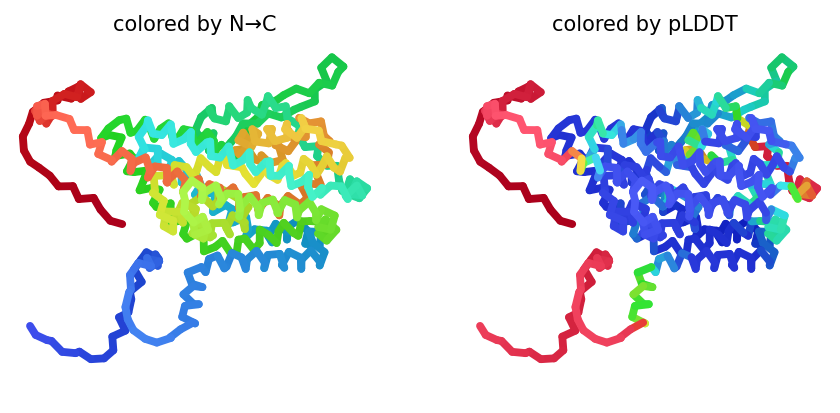

2023-11-09 07:39:24,526 alphafold2_ptm_model_4_seed_003 recycle=0 pLDDT=71.4 pTM=0.679
2023-11-09 07:39:30,423 alphafold2_ptm_model_4_seed_003 recycle=1 pLDDT=76.6 pTM=0.759 tol=3.23
2023-11-09 07:39:36,273 alphafold2_ptm_model_4_seed_003 recycle=2 pLDDT=75.1 pTM=0.739 tol=2.08
2023-11-09 07:39:42,142 alphafold2_ptm_model_4_seed_003 recycle=3 pLDDT=75.3 pTM=0.743 tol=0.936
2023-11-09 07:39:42,144 alphafold2_ptm_model_4_seed_003 took 23.5s (3 recycles)


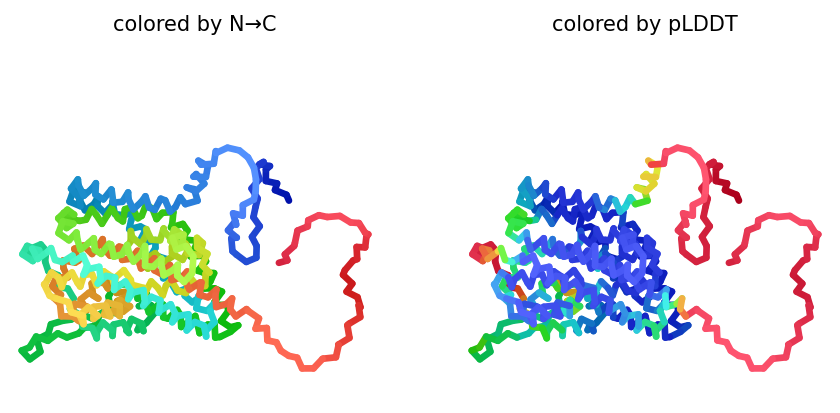

2023-11-09 07:39:48,637 alphafold2_ptm_model_5_seed_003 recycle=0 pLDDT=73.7 pTM=0.729
2023-11-09 07:39:54,541 alphafold2_ptm_model_5_seed_003 recycle=1 pLDDT=75.5 pTM=0.754 tol=4.61
2023-11-09 07:40:00,443 alphafold2_ptm_model_5_seed_003 recycle=2 pLDDT=76.1 pTM=0.757 tol=1.97
2023-11-09 07:40:06,345 alphafold2_ptm_model_5_seed_003 recycle=3 pLDDT=75.8 pTM=0.752 tol=1.57
2023-11-09 07:40:06,346 alphafold2_ptm_model_5_seed_003 took 23.6s (3 recycles)


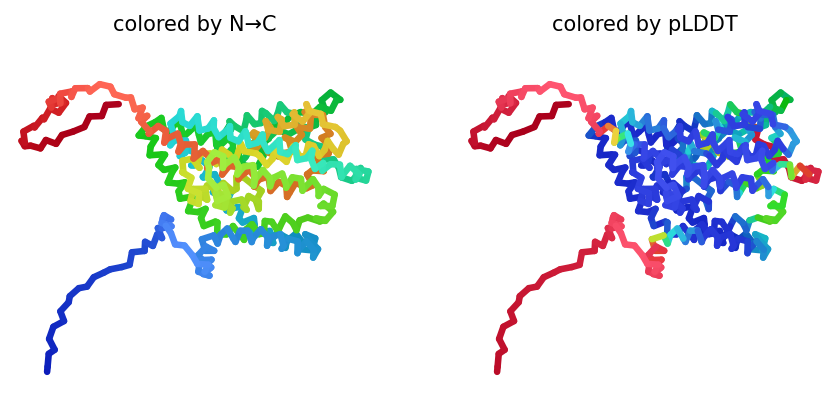

2023-11-09 07:40:16,822 alphafold2_ptm_model_1_seed_004 recycle=0 pLDDT=68.1 pTM=0.637
2023-11-09 07:40:22,586 alphafold2_ptm_model_1_seed_004 recycle=1 pLDDT=67.8 pTM=0.616 tol=4.82
2023-11-09 07:40:28,347 alphafold2_ptm_model_1_seed_004 recycle=2 pLDDT=67.6 pTM=0.608 tol=3.08
2023-11-09 07:40:34,114 alphafold2_ptm_model_1_seed_004 recycle=3 pLDDT=67.9 pTM=0.619 tol=2.27
2023-11-09 07:40:34,116 alphafold2_ptm_model_1_seed_004 took 23.0s (3 recycles)


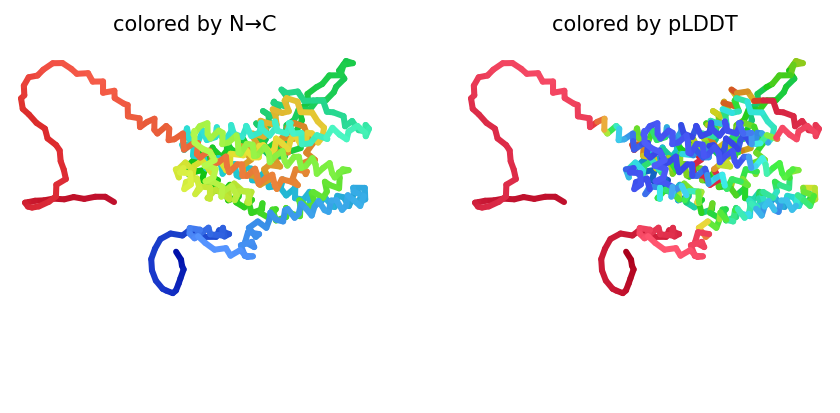

2023-11-09 07:40:40,498 alphafold2_ptm_model_2_seed_004 recycle=0 pLDDT=67.2 pTM=0.601
2023-11-09 07:40:46,289 alphafold2_ptm_model_2_seed_004 recycle=1 pLDDT=67.1 pTM=0.613 tol=5.04
2023-11-09 07:40:52,077 alphafold2_ptm_model_2_seed_004 recycle=2 pLDDT=68.7 pTM=0.657 tol=4.49
2023-11-09 07:40:57,865 alphafold2_ptm_model_2_seed_004 recycle=3 pLDDT=68.8 pTM=0.659 tol=3.76
2023-11-09 07:40:57,866 alphafold2_ptm_model_2_seed_004 took 23.2s (3 recycles)


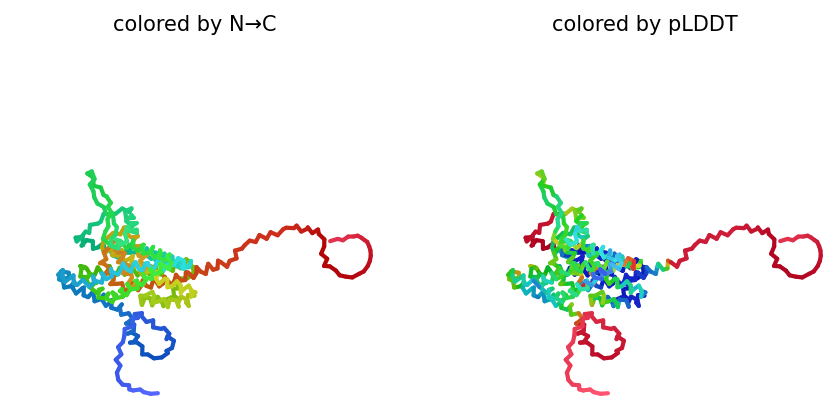

2023-11-09 07:41:04,280 alphafold2_ptm_model_3_seed_004 recycle=0 pLDDT=72.8 pTM=0.699
2023-11-09 07:41:10,138 alphafold2_ptm_model_3_seed_004 recycle=1 pLDDT=76.9 pTM=0.754 tol=4.25
2023-11-09 07:41:15,962 alphafold2_ptm_model_3_seed_004 recycle=2 pLDDT=76.7 pTM=0.743 tol=2.66
2023-11-09 07:41:21,801 alphafold2_ptm_model_3_seed_004 recycle=3 pLDDT=78.1 pTM=0.756 tol=2.33
2023-11-09 07:41:21,803 alphafold2_ptm_model_3_seed_004 took 23.3s (3 recycles)


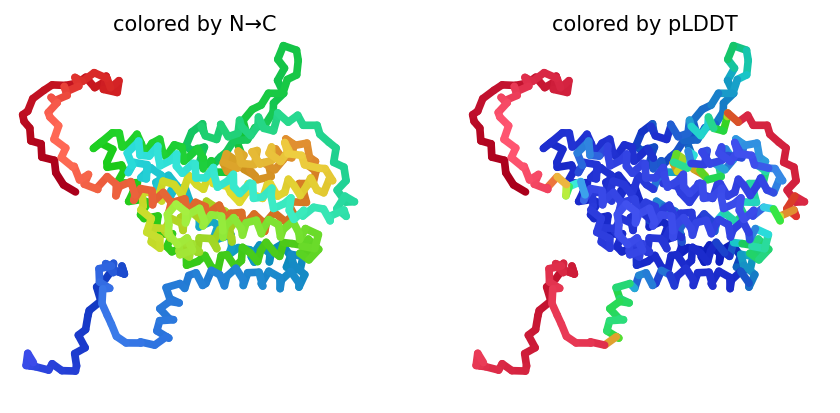

2023-11-09 07:41:28,218 alphafold2_ptm_model_4_seed_004 recycle=0 pLDDT=72.4 pTM=0.71
2023-11-09 07:41:34,028 alphafold2_ptm_model_4_seed_004 recycle=1 pLDDT=73.6 pTM=0.731 tol=2.68
2023-11-09 07:41:39,844 alphafold2_ptm_model_4_seed_004 recycle=2 pLDDT=74.8 pTM=0.742 tol=1.09
2023-11-09 07:41:45,654 alphafold2_ptm_model_4_seed_004 recycle=3 pLDDT=75.1 pTM=0.74 tol=1.01
2023-11-09 07:41:45,655 alphafold2_ptm_model_4_seed_004 took 23.2s (3 recycles)


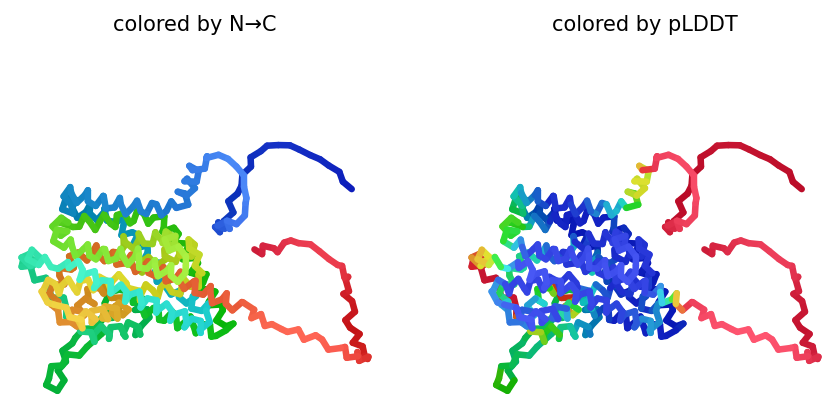

2023-11-09 07:41:52,078 alphafold2_ptm_model_5_seed_004 recycle=0 pLDDT=73.2 pTM=0.731
2023-11-09 07:41:57,943 alphafold2_ptm_model_5_seed_004 recycle=1 pLDDT=76.1 pTM=0.764 tol=5.07
2023-11-09 07:42:03,825 alphafold2_ptm_model_5_seed_004 recycle=2 pLDDT=75.9 pTM=0.755 tol=2.82
2023-11-09 07:42:09,665 alphafold2_ptm_model_5_seed_004 recycle=3 pLDDT=75.6 pTM=0.75 tol=1.39
2023-11-09 07:42:09,666 alphafold2_ptm_model_5_seed_004 took 23.4s (3 recycles)


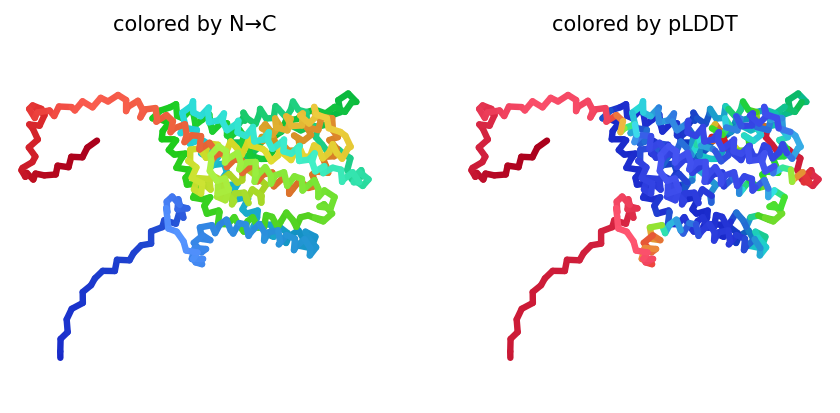

2023-11-09 07:42:19,959 alphafold2_ptm_model_1_seed_005 recycle=0 pLDDT=69.2 pTM=0.663
2023-11-09 07:42:25,767 alphafold2_ptm_model_1_seed_005 recycle=1 pLDDT=69.7 pTM=0.669 tol=4.3
2023-11-09 07:42:31,584 alphafold2_ptm_model_1_seed_005 recycle=2 pLDDT=70.1 pTM=0.667 tol=2.52
2023-11-09 07:42:37,383 alphafold2_ptm_model_1_seed_005 recycle=3 pLDDT=70.1 pTM=0.668 tol=1.53
2023-11-09 07:42:37,385 alphafold2_ptm_model_1_seed_005 took 23.3s (3 recycles)


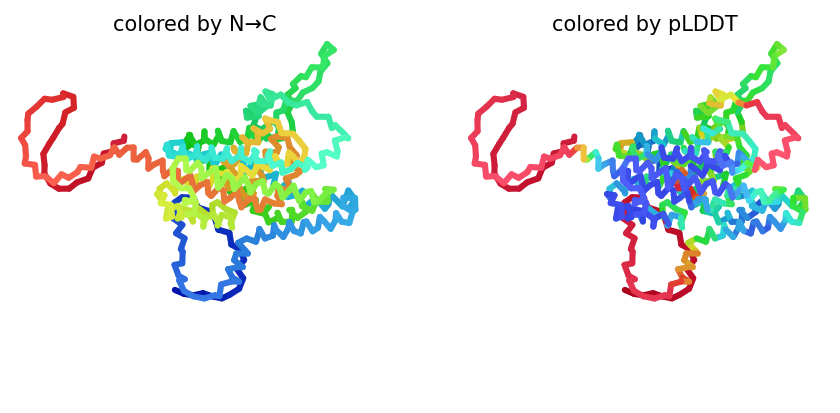

2023-11-09 07:42:43,818 alphafold2_ptm_model_2_seed_005 recycle=0 pLDDT=69.1 pTM=0.663
2023-11-09 07:42:49,655 alphafold2_ptm_model_2_seed_005 recycle=1 pLDDT=71.4 pTM=0.693 tol=4.15
2023-11-09 07:42:55,492 alphafold2_ptm_model_2_seed_005 recycle=2 pLDDT=70.6 pTM=0.672 tol=2.49
2023-11-09 07:43:01,319 alphafold2_ptm_model_2_seed_005 recycle=3 pLDDT=70.7 pTM=0.668 tol=0.937
2023-11-09 07:43:01,320 alphafold2_ptm_model_2_seed_005 took 23.4s (3 recycles)


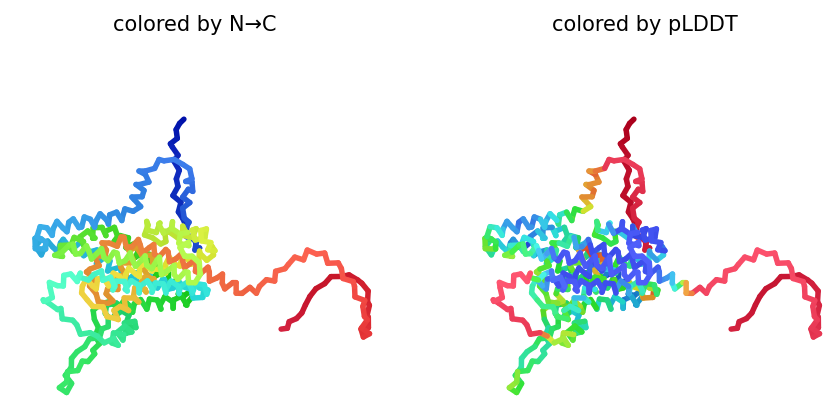

2023-11-09 07:43:07,744 alphafold2_ptm_model_3_seed_005 recycle=0 pLDDT=69.6 pTM=0.689
2023-11-09 07:43:13,592 alphafold2_ptm_model_3_seed_005 recycle=1 pLDDT=73.8 pTM=0.726 tol=5.76
2023-11-09 07:43:19,444 alphafold2_ptm_model_3_seed_005 recycle=2 pLDDT=73.4 pTM=0.723 tol=1.86
2023-11-09 07:43:25,271 alphafold2_ptm_model_3_seed_005 recycle=3 pLDDT=74.1 pTM=0.728 tol=1.43
2023-11-09 07:43:25,272 alphafold2_ptm_model_3_seed_005 took 23.4s (3 recycles)


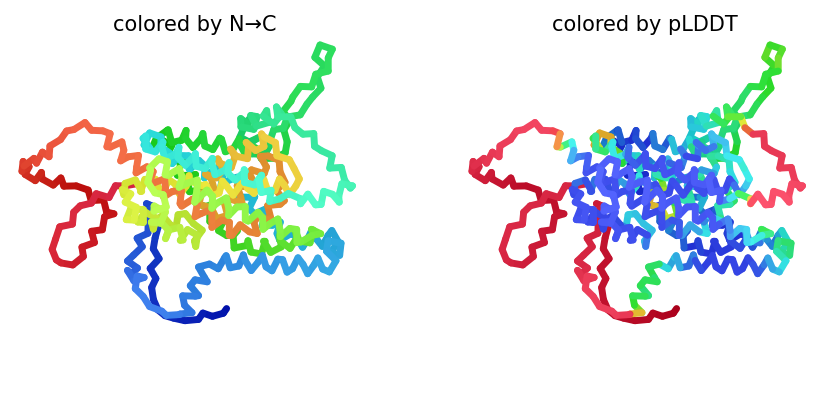

2023-11-09 07:43:31,712 alphafold2_ptm_model_4_seed_005 recycle=0 pLDDT=67.1 pTM=0.618
2023-11-09 07:43:37,564 alphafold2_ptm_model_4_seed_005 recycle=1 pLDDT=74.4 pTM=0.737 tol=3.24
2023-11-09 07:43:43,403 alphafold2_ptm_model_4_seed_005 recycle=2 pLDDT=73.2 pTM=0.719 tol=1.61
2023-11-09 07:43:49,226 alphafold2_ptm_model_4_seed_005 recycle=3 pLDDT=74.1 pTM=0.727 tol=1.2
2023-11-09 07:43:49,227 alphafold2_ptm_model_4_seed_005 took 23.3s (3 recycles)


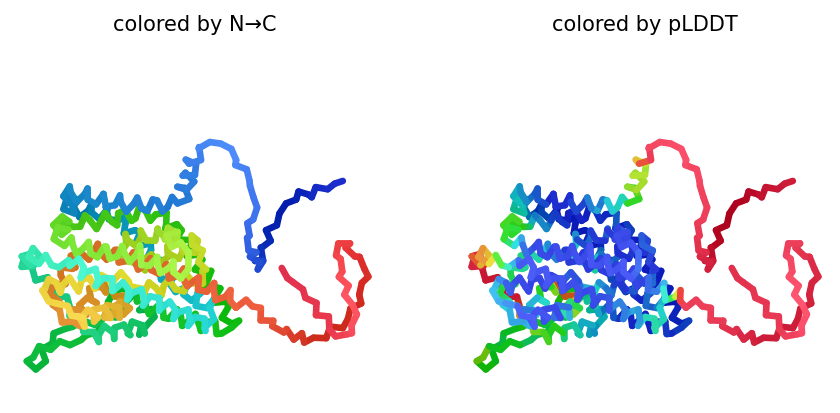

2023-11-09 07:43:55,687 alphafold2_ptm_model_5_seed_005 recycle=0 pLDDT=69.4 pTM=0.648
2023-11-09 07:44:01,555 alphafold2_ptm_model_5_seed_005 recycle=1 pLDDT=74.9 pTM=0.744 tol=4.6
2023-11-09 07:44:07,448 alphafold2_ptm_model_5_seed_005 recycle=2 pLDDT=75.8 pTM=0.757 tol=3.91
2023-11-09 07:44:13,311 alphafold2_ptm_model_5_seed_005 recycle=3 pLDDT=75.4 pTM=0.754 tol=2.87
2023-11-09 07:44:13,312 alphafold2_ptm_model_5_seed_005 took 23.5s (3 recycles)


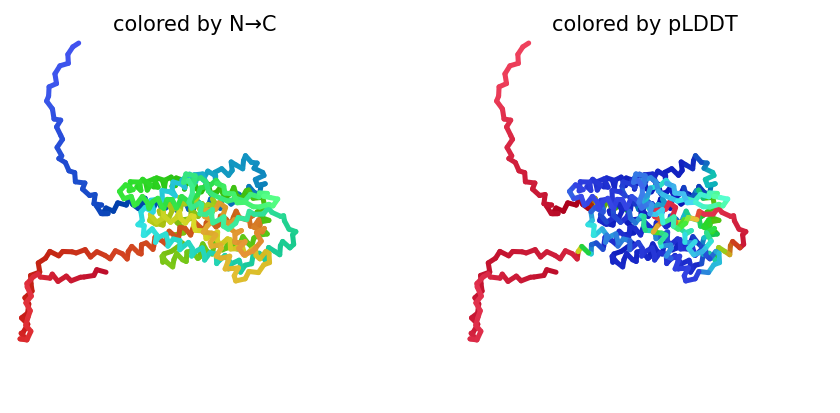

2023-11-09 07:44:23,649 alphafold2_ptm_model_1_seed_006 recycle=0 pLDDT=69.8 pTM=0.639
2023-11-09 07:44:29,463 alphafold2_ptm_model_1_seed_006 recycle=1 pLDDT=69.6 pTM=0.649 tol=5.29
2023-11-09 07:44:35,300 alphafold2_ptm_model_1_seed_006 recycle=2 pLDDT=71.1 pTM=0.685 tol=2.9
2023-11-09 07:44:41,119 alphafold2_ptm_model_1_seed_006 recycle=3 pLDDT=70.2 pTM=0.658 tol=2.07
2023-11-09 07:44:41,121 alphafold2_ptm_model_1_seed_006 took 23.3s (3 recycles)


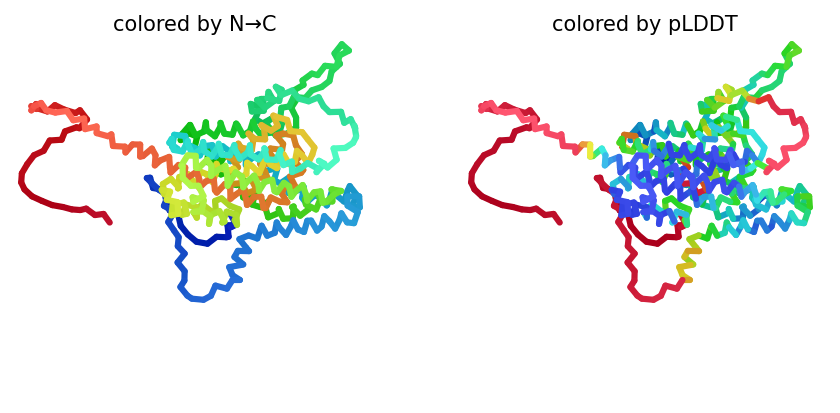

2023-11-09 07:44:47,589 alphafold2_ptm_model_2_seed_006 recycle=0 pLDDT=69.4 pTM=0.636
2023-11-09 07:44:53,434 alphafold2_ptm_model_2_seed_006 recycle=1 pLDDT=70.5 pTM=0.671 tol=4.99
2023-11-09 07:44:59,280 alphafold2_ptm_model_2_seed_006 recycle=2 pLDDT=70.6 pTM=0.669 tol=2.22
2023-11-09 07:45:05,129 alphafold2_ptm_model_2_seed_006 recycle=3 pLDDT=70.8 pTM=0.667 tol=1.48
2023-11-09 07:45:05,131 alphafold2_ptm_model_2_seed_006 took 23.4s (3 recycles)


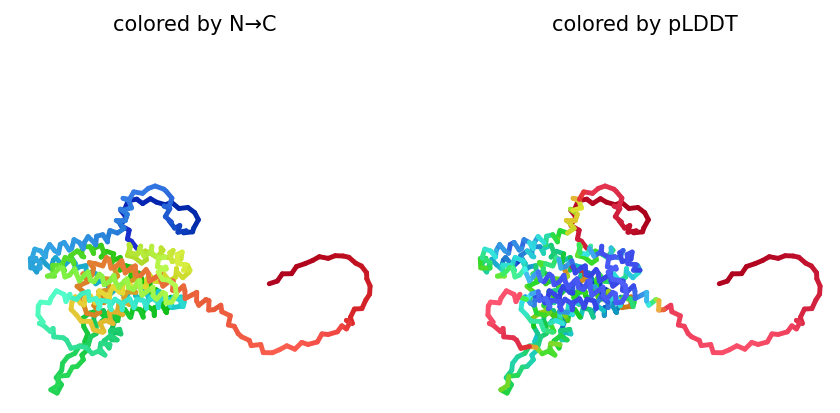

2023-11-09 07:45:11,577 alphafold2_ptm_model_3_seed_006 recycle=0 pLDDT=73.9 pTM=0.713
2023-11-09 07:45:17,492 alphafold2_ptm_model_3_seed_006 recycle=1 pLDDT=78 pTM=0.764 tol=4.02
2023-11-09 07:45:23,380 alphafold2_ptm_model_3_seed_006 recycle=2 pLDDT=78 pTM=0.762 tol=3.04
2023-11-09 07:45:29,270 alphafold2_ptm_model_3_seed_006 recycle=3 pLDDT=78.5 pTM=0.761 tol=1.91
2023-11-09 07:45:29,272 alphafold2_ptm_model_3_seed_006 took 23.5s (3 recycles)


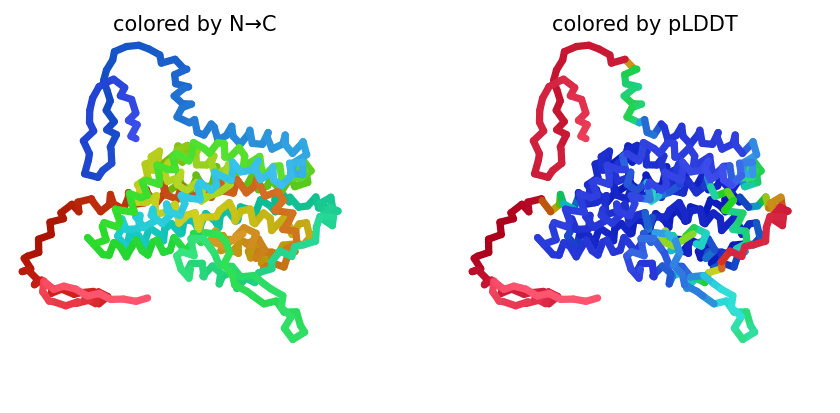

2023-11-09 07:45:35,700 alphafold2_ptm_model_4_seed_006 recycle=0 pLDDT=69.2 pTM=0.645
2023-11-09 07:45:41,567 alphafold2_ptm_model_4_seed_006 recycle=1 pLDDT=74.5 pTM=0.737 tol=4.41
2023-11-09 07:45:47,421 alphafold2_ptm_model_4_seed_006 recycle=2 pLDDT=74.9 pTM=0.739 tol=1.62
2023-11-09 07:45:53,281 alphafold2_ptm_model_4_seed_006 recycle=3 pLDDT=75.2 pTM=0.741 tol=0.795
2023-11-09 07:45:53,283 alphafold2_ptm_model_4_seed_006 took 23.4s (3 recycles)


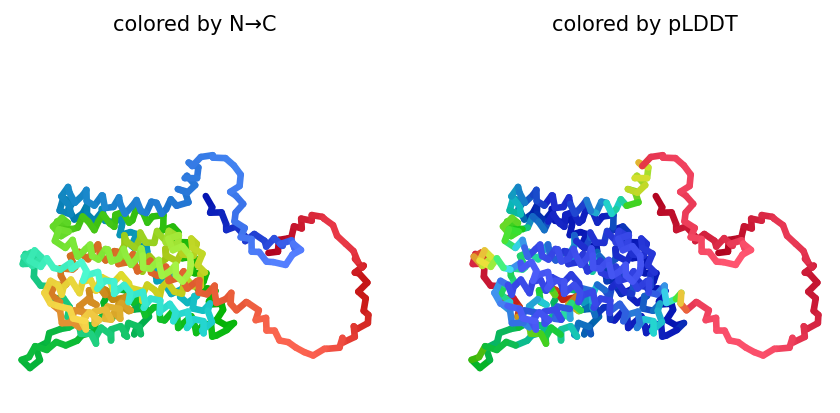

2023-11-09 07:45:59,770 alphafold2_ptm_model_5_seed_006 recycle=0 pLDDT=70.8 pTM=0.684
2023-11-09 07:46:05,641 alphafold2_ptm_model_5_seed_006 recycle=1 pLDDT=73.1 pTM=0.723 tol=3.4
2023-11-09 07:46:11,493 alphafold2_ptm_model_5_seed_006 recycle=2 pLDDT=69.4 pTM=0.667 tol=3.86
2023-11-09 07:46:17,371 alphafold2_ptm_model_5_seed_006 recycle=3 pLDDT=73.8 pTM=0.733 tol=4.74
2023-11-09 07:46:17,373 alphafold2_ptm_model_5_seed_006 took 23.5s (3 recycles)


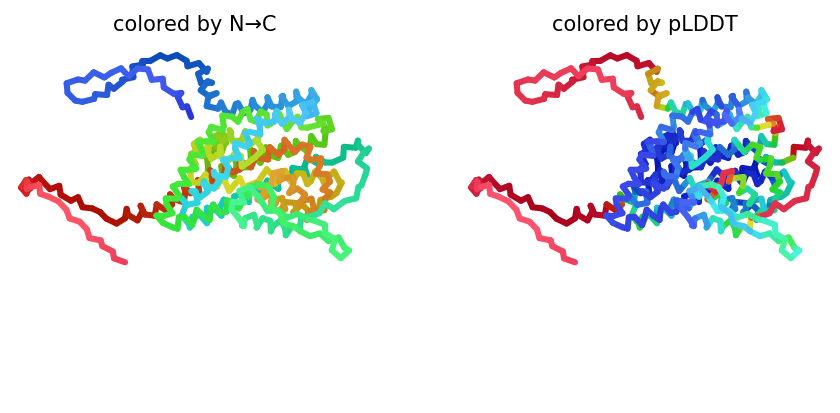

2023-11-09 07:46:27,774 alphafold2_ptm_model_1_seed_007 recycle=0 pLDDT=68.6 pTM=0.651
2023-11-09 07:46:33,595 alphafold2_ptm_model_1_seed_007 recycle=1 pLDDT=66.5 pTM=0.623 tol=4.27
2023-11-09 07:46:39,401 alphafold2_ptm_model_1_seed_007 recycle=2 pLDDT=64.2 pTM=0.587 tol=4.09
2023-11-09 07:46:45,206 alphafold2_ptm_model_1_seed_007 recycle=3 pLDDT=64.8 pTM=0.596 tol=2.21
2023-11-09 07:46:45,208 alphafold2_ptm_model_1_seed_007 took 23.3s (3 recycles)


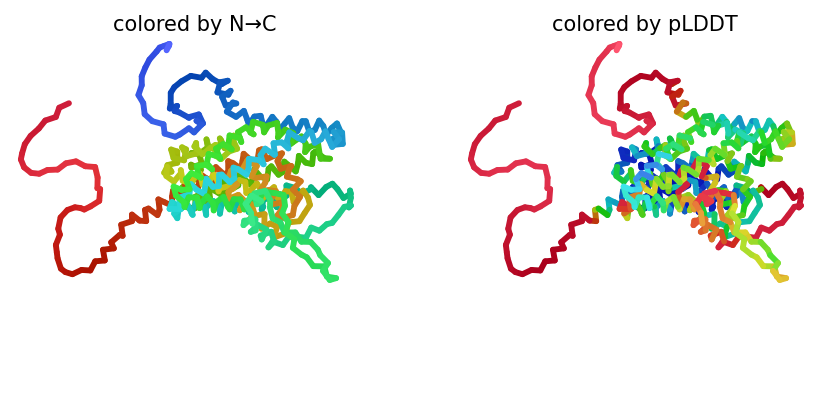

2023-11-09 07:46:51,666 alphafold2_ptm_model_2_seed_007 recycle=0 pLDDT=68.6 pTM=0.635
2023-11-09 07:46:57,523 alphafold2_ptm_model_2_seed_007 recycle=1 pLDDT=70.1 pTM=0.673 tol=5.64
2023-11-09 07:47:03,363 alphafold2_ptm_model_2_seed_007 recycle=2 pLDDT=67.5 pTM=0.622 tol=5.48
2023-11-09 07:47:09,210 alphafold2_ptm_model_2_seed_007 recycle=3 pLDDT=67.3 pTM=0.618 tol=2.04
2023-11-09 07:47:09,212 alphafold2_ptm_model_2_seed_007 took 23.4s (3 recycles)


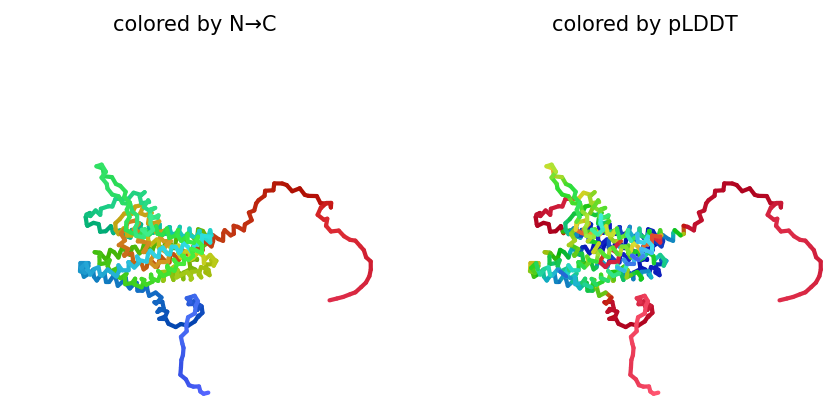

2023-11-09 07:47:16,003 alphafold2_ptm_model_3_seed_007 recycle=0 pLDDT=71.8 pTM=0.677
2023-11-09 07:47:21,810 alphafold2_ptm_model_3_seed_007 recycle=1 pLDDT=72.4 pTM=0.675 tol=2.28
2023-11-09 07:47:27,664 alphafold2_ptm_model_3_seed_007 recycle=2 pLDDT=72.5 pTM=0.671 tol=1.84
2023-11-09 07:47:33,466 alphafold2_ptm_model_3_seed_007 recycle=3 pLDDT=73.4 pTM=0.707 tol=1.93
2023-11-09 07:47:33,467 alphafold2_ptm_model_3_seed_007 took 23.3s (3 recycles)


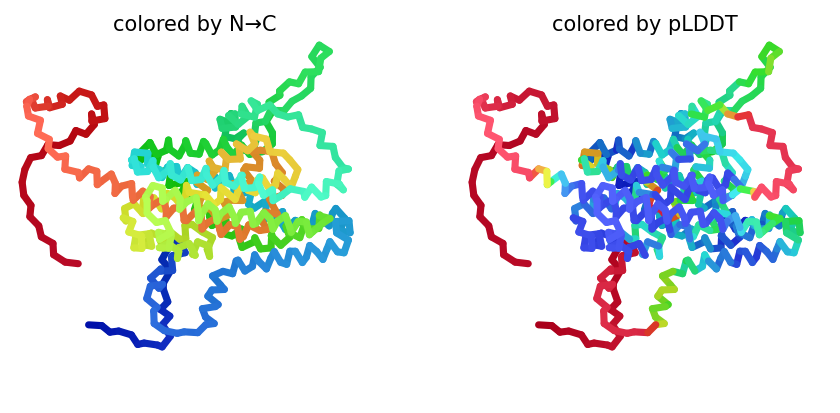

2023-11-09 07:47:39,944 alphafold2_ptm_model_4_seed_007 recycle=0 pLDDT=71.8 pTM=0.686
2023-11-09 07:47:45,773 alphafold2_ptm_model_4_seed_007 recycle=1 pLDDT=75.6 pTM=0.75 tol=3.3
2023-11-09 07:47:51,629 alphafold2_ptm_model_4_seed_007 recycle=2 pLDDT=74.2 pTM=0.734 tol=1.83
2023-11-09 07:47:57,439 alphafold2_ptm_model_4_seed_007 recycle=3 pLDDT=74.9 pTM=0.74 tol=1.08
2023-11-09 07:47:57,441 alphafold2_ptm_model_4_seed_007 took 23.4s (3 recycles)


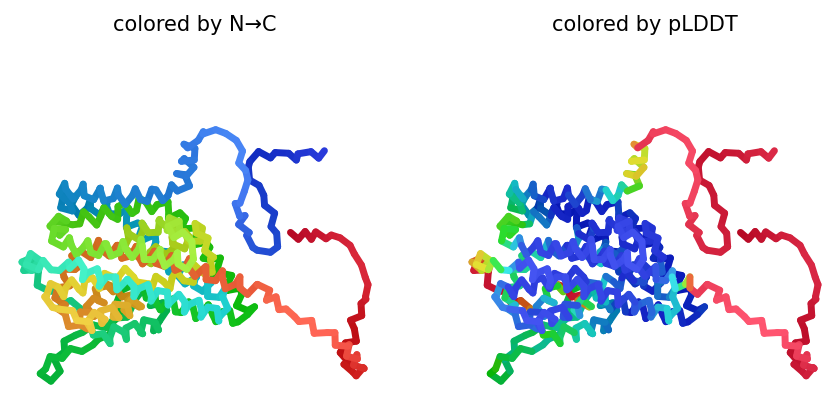

2023-11-09 07:48:03,911 alphafold2_ptm_model_5_seed_007 recycle=0 pLDDT=71.9 pTM=0.696
2023-11-09 07:48:09,777 alphafold2_ptm_model_5_seed_007 recycle=1 pLDDT=75.8 pTM=0.761 tol=6.66
2023-11-09 07:48:15,694 alphafold2_ptm_model_5_seed_007 recycle=2 pLDDT=75.9 pTM=0.759 tol=2.77
2023-11-09 07:48:21,523 alphafold2_ptm_model_5_seed_007 recycle=3 pLDDT=74.7 pTM=0.747 tol=1.78
2023-11-09 07:48:21,524 alphafold2_ptm_model_5_seed_007 took 23.5s (3 recycles)


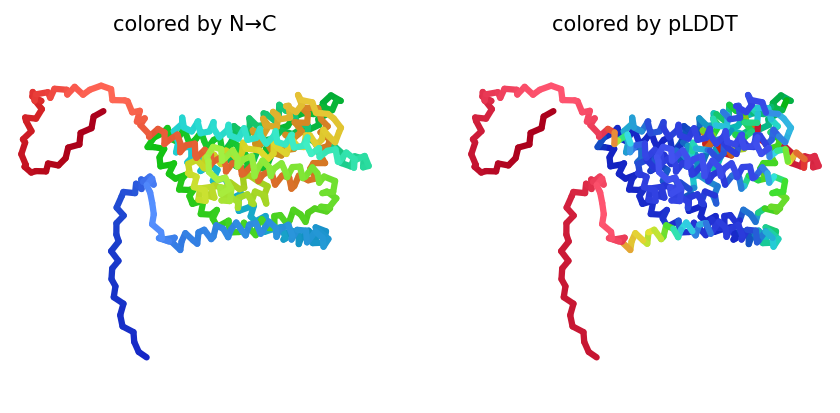

2023-11-09 07:48:31,819 alphafold2_ptm_model_1_seed_008 recycle=0 pLDDT=69.6 pTM=0.648
2023-11-09 07:48:37,588 alphafold2_ptm_model_1_seed_008 recycle=1 pLDDT=71.3 pTM=0.696 tol=3.81
2023-11-09 07:48:43,403 alphafold2_ptm_model_1_seed_008 recycle=2 pLDDT=70.9 pTM=0.676 tol=2.11
2023-11-09 07:48:49,186 alphafold2_ptm_model_1_seed_008 recycle=3 pLDDT=71.8 pTM=0.69 tol=2.37
2023-11-09 07:48:49,188 alphafold2_ptm_model_1_seed_008 took 23.2s (3 recycles)


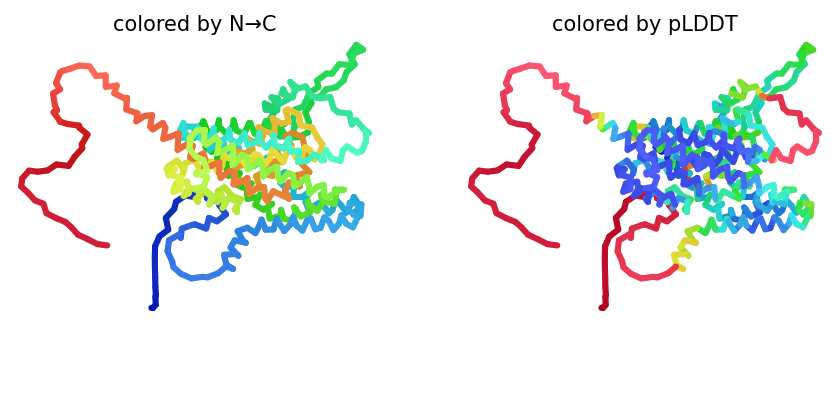

2023-11-09 07:48:55,647 alphafold2_ptm_model_2_seed_008 recycle=0 pLDDT=69.6 pTM=0.661
2023-11-09 07:49:01,446 alphafold2_ptm_model_2_seed_008 recycle=1 pLDDT=70.9 pTM=0.693 tol=3.75
2023-11-09 07:49:07,281 alphafold2_ptm_model_2_seed_008 recycle=2 pLDDT=69.5 pTM=0.67 tol=3.48
2023-11-09 07:49:13,082 alphafold2_ptm_model_2_seed_008 recycle=3 pLDDT=70.8 pTM=0.688 tol=3.01
2023-11-09 07:49:13,083 alphafold2_ptm_model_2_seed_008 took 23.3s (3 recycles)


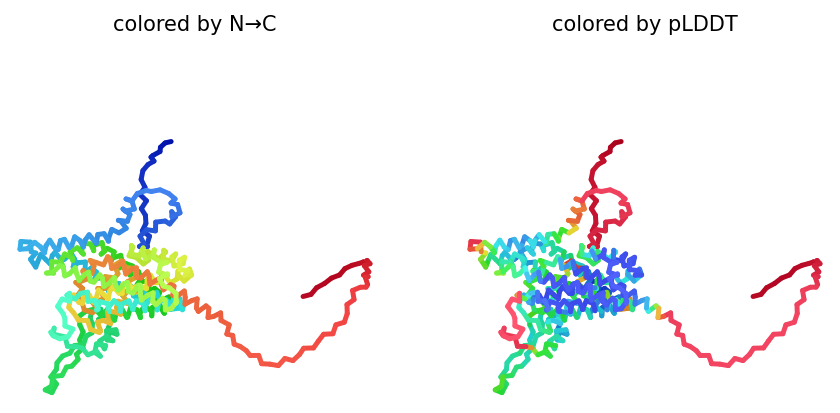

2023-11-09 07:49:19,528 alphafold2_ptm_model_3_seed_008 recycle=0 pLDDT=72.9 pTM=0.705
2023-11-09 07:49:25,384 alphafold2_ptm_model_3_seed_008 recycle=1 pLDDT=77.3 pTM=0.763 tol=3.36
2023-11-09 07:49:31,274 alphafold2_ptm_model_3_seed_008 recycle=2 pLDDT=77.8 pTM=0.76 tol=1.52
2023-11-09 07:49:37,120 alphafold2_ptm_model_3_seed_008 recycle=3 pLDDT=78.1 pTM=0.761 tol=1.31
2023-11-09 07:49:37,121 alphafold2_ptm_model_3_seed_008 took 23.4s (3 recycles)


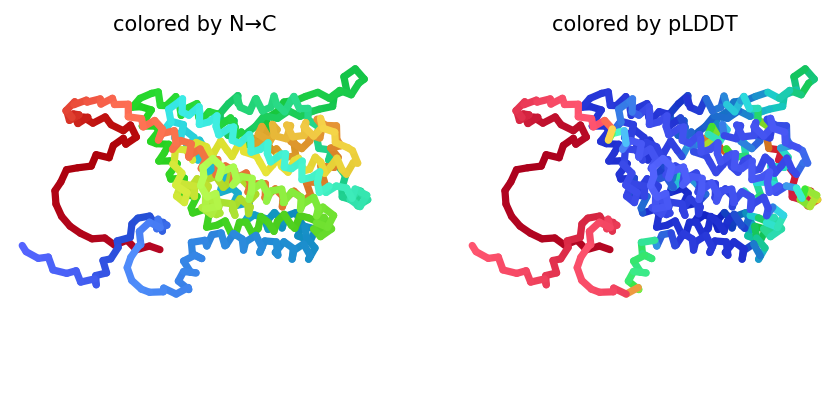

2023-11-09 07:49:43,560 alphafold2_ptm_model_4_seed_008 recycle=0 pLDDT=72 pTM=0.698
2023-11-09 07:49:49,363 alphafold2_ptm_model_4_seed_008 recycle=1 pLDDT=74.3 pTM=0.733 tol=3
2023-11-09 07:49:55,192 alphafold2_ptm_model_4_seed_008 recycle=2 pLDDT=73.2 pTM=0.716 tol=1.39
2023-11-09 07:50:00,984 alphafold2_ptm_model_4_seed_008 recycle=3 pLDDT=73.7 pTM=0.72 tol=1.13
2023-11-09 07:50:00,986 alphafold2_ptm_model_4_seed_008 took 23.3s (3 recycles)


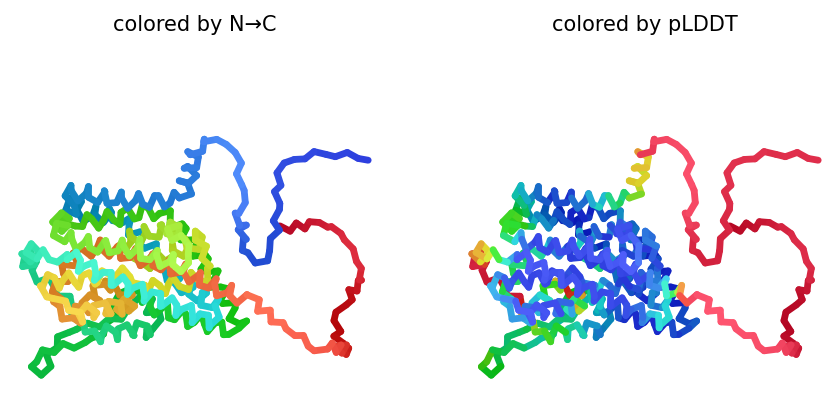

2023-11-09 07:50:07,430 alphafold2_ptm_model_5_seed_008 recycle=0 pLDDT=71.1 pTM=0.678
2023-11-09 07:50:13,280 alphafold2_ptm_model_5_seed_008 recycle=1 pLDDT=76.5 pTM=0.761 tol=3.7
2023-11-09 07:50:19,161 alphafold2_ptm_model_5_seed_008 recycle=2 pLDDT=75.4 pTM=0.749 tol=1.81
2023-11-09 07:50:24,993 alphafold2_ptm_model_5_seed_008 recycle=3 pLDDT=75 pTM=0.746 tol=1.18
2023-11-09 07:50:24,995 alphafold2_ptm_model_5_seed_008 took 23.4s (3 recycles)


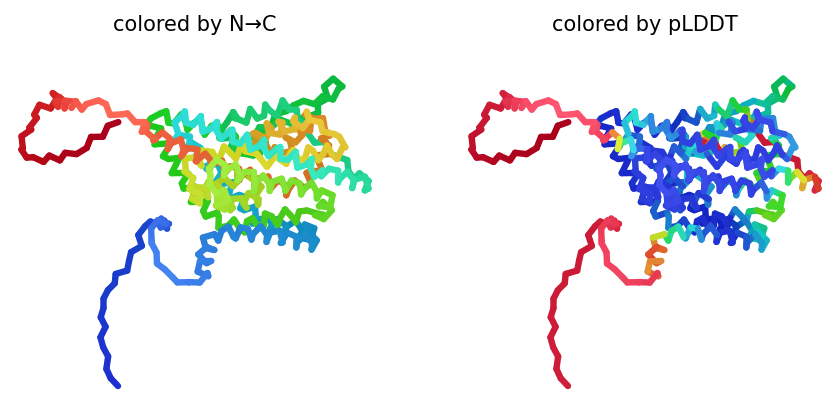

2023-11-09 07:50:35,317 alphafold2_ptm_model_1_seed_009 recycle=0 pLDDT=67.8 pTM=0.607
2023-11-09 07:50:41,127 alphafold2_ptm_model_1_seed_009 recycle=1 pLDDT=71.4 pTM=0.701 tol=4.91
2023-11-09 07:50:46,937 alphafold2_ptm_model_1_seed_009 recycle=2 pLDDT=70.8 pTM=0.704 tol=2.31
2023-11-09 07:50:52,753 alphafold2_ptm_model_1_seed_009 recycle=3 pLDDT=71 pTM=0.696 tol=1.37
2023-11-09 07:50:52,754 alphafold2_ptm_model_1_seed_009 took 23.3s (3 recycles)


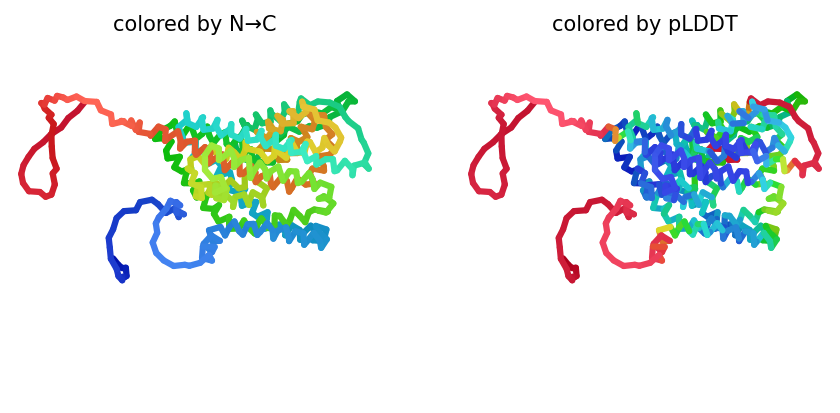

2023-11-09 07:50:59,221 alphafold2_ptm_model_2_seed_009 recycle=0 pLDDT=67.3 pTM=0.641
2023-11-09 07:51:05,057 alphafold2_ptm_model_2_seed_009 recycle=1 pLDDT=69.8 pTM=0.684 tol=3.55
2023-11-09 07:51:10,889 alphafold2_ptm_model_2_seed_009 recycle=2 pLDDT=70.3 pTM=0.691 tol=2.12
2023-11-09 07:51:16,726 alphafold2_ptm_model_2_seed_009 recycle=3 pLDDT=71.1 pTM=0.695 tol=3.44
2023-11-09 07:51:16,727 alphafold2_ptm_model_2_seed_009 took 23.4s (3 recycles)


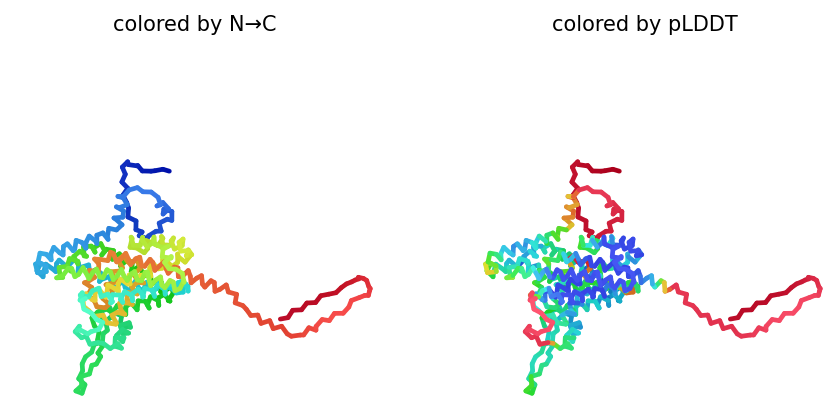

2023-11-09 07:51:23,165 alphafold2_ptm_model_3_seed_009 recycle=0 pLDDT=72.9 pTM=0.694
2023-11-09 07:51:29,026 alphafold2_ptm_model_3_seed_009 recycle=1 pLDDT=75.1 pTM=0.732 tol=2.67
2023-11-09 07:51:34,902 alphafold2_ptm_model_3_seed_009 recycle=2 pLDDT=75.4 pTM=0.736 tol=2.01
2023-11-09 07:51:40,785 alphafold2_ptm_model_3_seed_009 recycle=3 pLDDT=77.1 pTM=0.747 tol=1.5
2023-11-09 07:51:40,786 alphafold2_ptm_model_3_seed_009 took 23.5s (3 recycles)


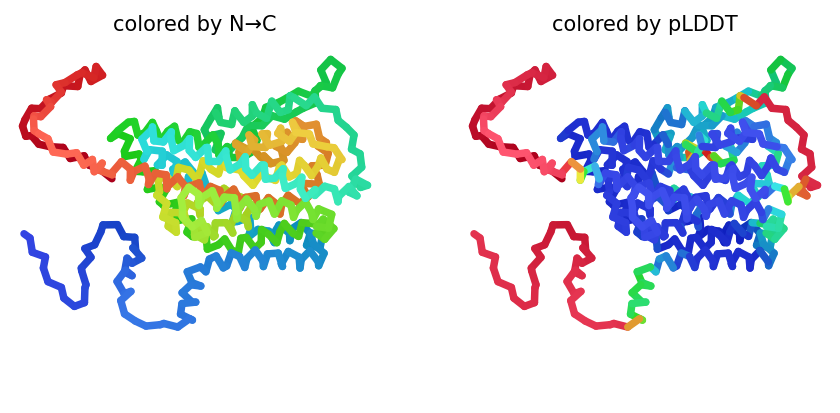

2023-11-09 07:51:47,251 alphafold2_ptm_model_4_seed_009 recycle=0 pLDDT=71.2 pTM=0.686
2023-11-09 07:51:53,110 alphafold2_ptm_model_4_seed_009 recycle=1 pLDDT=74.5 pTM=0.742 tol=3.23
2023-11-09 07:51:58,963 alphafold2_ptm_model_4_seed_009 recycle=2 pLDDT=74.6 pTM=0.742 tol=2.59
2023-11-09 07:52:04,817 alphafold2_ptm_model_4_seed_009 recycle=3 pLDDT=75.1 pTM=0.742 tol=2.06
2023-11-09 07:52:04,818 alphafold2_ptm_model_4_seed_009 took 23.4s (3 recycles)


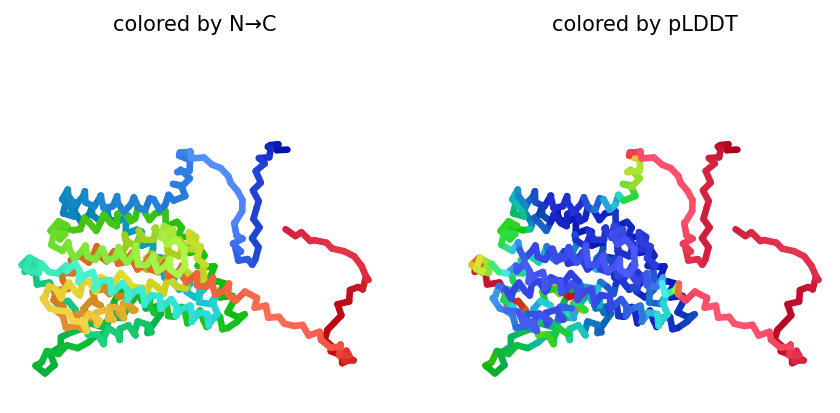

2023-11-09 07:52:11,272 alphafold2_ptm_model_5_seed_009 recycle=0 pLDDT=72.2 pTM=0.717
2023-11-09 07:52:17,180 alphafold2_ptm_model_5_seed_009 recycle=1 pLDDT=75.9 pTM=0.76 tol=3.94
2023-11-09 07:52:23,050 alphafold2_ptm_model_5_seed_009 recycle=2 pLDDT=74.8 pTM=0.75 tol=2.81
2023-11-09 07:52:28,935 alphafold2_ptm_model_5_seed_009 recycle=3 pLDDT=75.2 pTM=0.749 tol=2.16
2023-11-09 07:52:28,936 alphafold2_ptm_model_5_seed_009 took 23.5s (3 recycles)


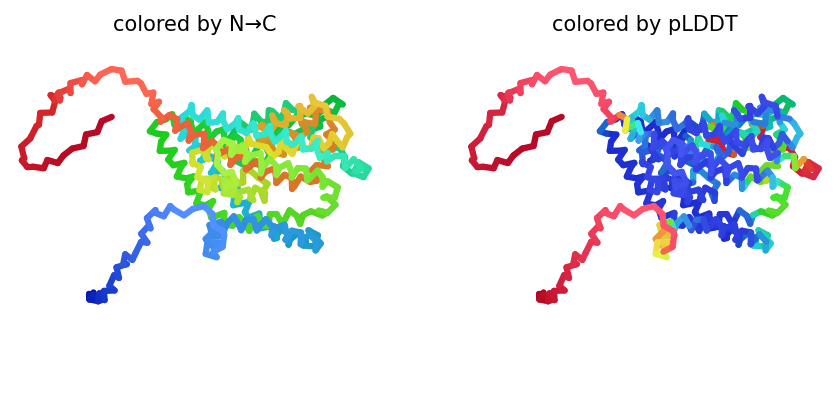

2023-11-09 07:52:39,322 alphafold2_ptm_model_1_seed_010 recycle=0 pLDDT=68.4 pTM=0.613
2023-11-09 07:52:45,153 alphafold2_ptm_model_1_seed_010 recycle=1 pLDDT=72.2 pTM=0.705 tol=4.94
2023-11-09 07:52:50,978 alphafold2_ptm_model_1_seed_010 recycle=2 pLDDT=73 pTM=0.724 tol=3.35
2023-11-09 07:52:56,798 alphafold2_ptm_model_1_seed_010 recycle=3 pLDDT=71.8 pTM=0.701 tol=2.81
2023-11-09 07:52:56,799 alphafold2_ptm_model_1_seed_010 took 23.3s (3 recycles)


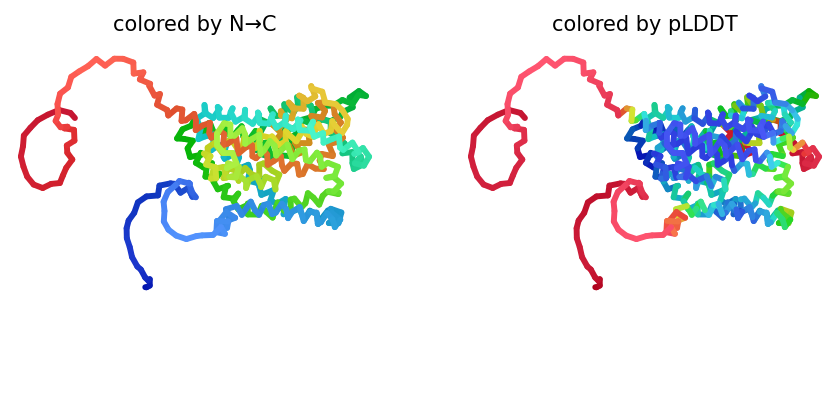

2023-11-09 07:53:03,230 alphafold2_ptm_model_2_seed_010 recycle=0 pLDDT=66.2 pTM=0.576
2023-11-09 07:53:09,083 alphafold2_ptm_model_2_seed_010 recycle=1 pLDDT=67.7 pTM=0.61 tol=4.78
2023-11-09 07:53:14,921 alphafold2_ptm_model_2_seed_010 recycle=2 pLDDT=69.9 pTM=0.692 tol=4.23
2023-11-09 07:53:20,763 alphafold2_ptm_model_2_seed_010 recycle=3 pLDDT=70.2 pTM=0.7 tol=3.28
2023-11-09 07:53:20,765 alphafold2_ptm_model_2_seed_010 took 23.4s (3 recycles)


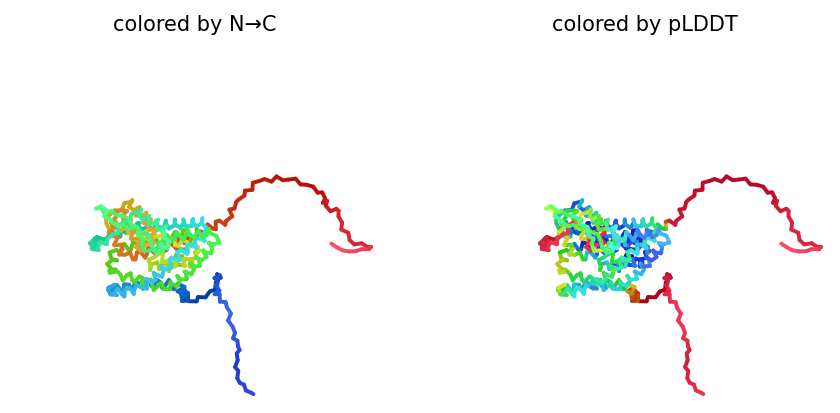

2023-11-09 07:53:27,173 alphafold2_ptm_model_3_seed_010 recycle=0 pLDDT=69.5 pTM=0.629
2023-11-09 07:53:33,072 alphafold2_ptm_model_3_seed_010 recycle=1 pLDDT=77.4 pTM=0.759 tol=3.05
2023-11-09 07:53:38,957 alphafold2_ptm_model_3_seed_010 recycle=2 pLDDT=77.5 pTM=0.757 tol=1.85
2023-11-09 07:53:44,839 alphafold2_ptm_model_3_seed_010 recycle=3 pLDDT=78.1 pTM=0.759 tol=1.74
2023-11-09 07:53:44,840 alphafold2_ptm_model_3_seed_010 took 23.5s (3 recycles)


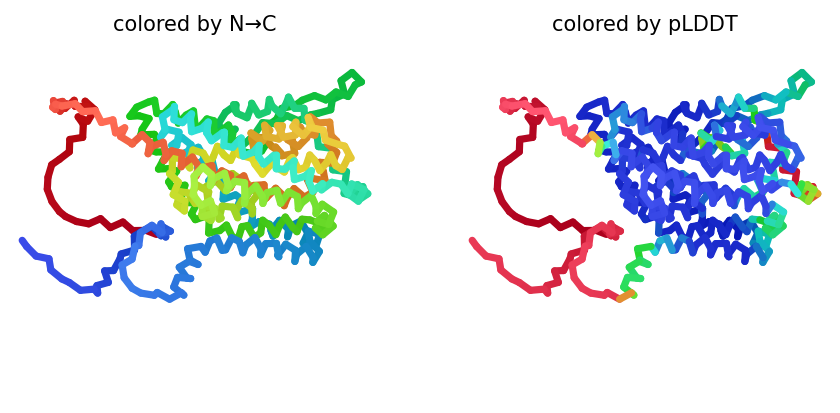

2023-11-09 07:53:51,284 alphafold2_ptm_model_4_seed_010 recycle=0 pLDDT=69.4 pTM=0.644
2023-11-09 07:53:57,160 alphafold2_ptm_model_4_seed_010 recycle=1 pLDDT=75.3 pTM=0.748 tol=2.82
2023-11-09 07:54:02,995 alphafold2_ptm_model_4_seed_010 recycle=2 pLDDT=73.6 pTM=0.731 tol=1.37
2023-11-09 07:54:08,839 alphafold2_ptm_model_4_seed_010 recycle=3 pLDDT=74.1 pTM=0.732 tol=1.39
2023-11-09 07:54:08,841 alphafold2_ptm_model_4_seed_010 took 23.4s (3 recycles)


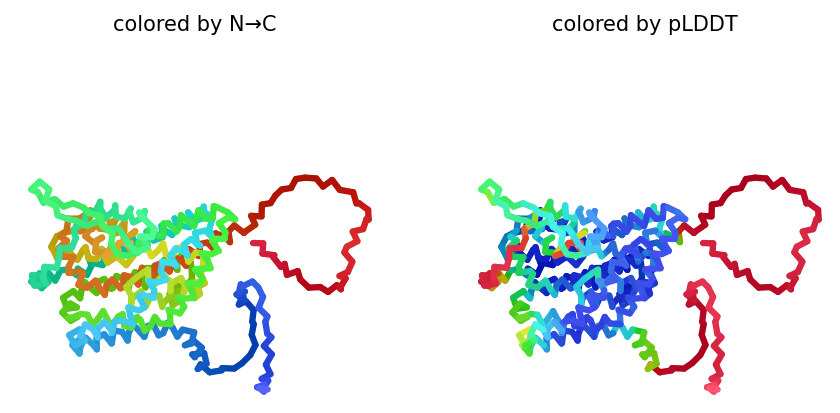

2023-11-09 07:54:15,285 alphafold2_ptm_model_5_seed_010 recycle=0 pLDDT=72.8 pTM=0.716
2023-11-09 07:54:21,202 alphafold2_ptm_model_5_seed_010 recycle=1 pLDDT=75.9 pTM=0.755 tol=2.93
2023-11-09 07:54:27,092 alphafold2_ptm_model_5_seed_010 recycle=2 pLDDT=75.1 pTM=0.75 tol=2.63
2023-11-09 07:54:32,976 alphafold2_ptm_model_5_seed_010 recycle=3 pLDDT=74.9 pTM=0.743 tol=2.8
2023-11-09 07:54:32,978 alphafold2_ptm_model_5_seed_010 took 23.6s (3 recycles)


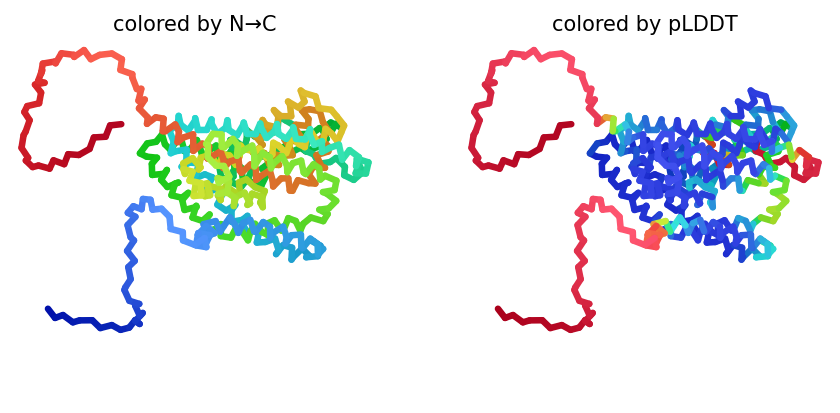

2023-11-09 07:54:43,584 alphafold2_ptm_model_1_seed_011 recycle=0 pLDDT=69.6 pTM=0.67
2023-11-09 07:54:49,341 alphafold2_ptm_model_1_seed_011 recycle=1 pLDDT=70.8 pTM=0.674 tol=4.32
2023-11-09 07:54:55,153 alphafold2_ptm_model_1_seed_011 recycle=2 pLDDT=69.8 pTM=0.651 tol=3.65
2023-11-09 07:55:00,967 alphafold2_ptm_model_1_seed_011 recycle=3 pLDDT=69.2 pTM=0.647 tol=2.55
2023-11-09 07:55:00,969 alphafold2_ptm_model_1_seed_011 took 23.2s (3 recycles)


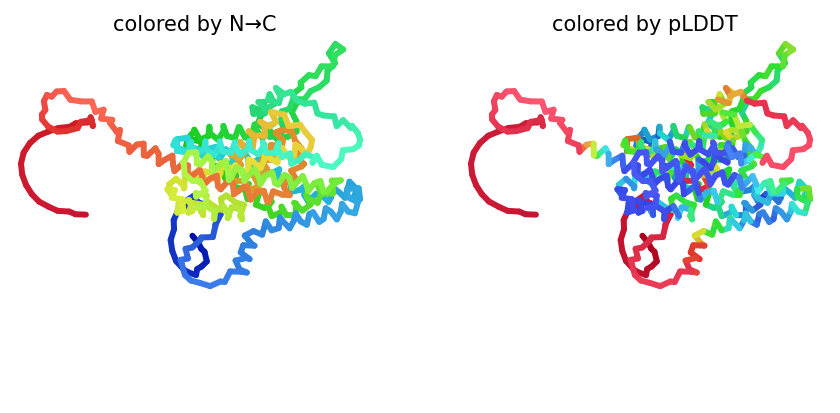

2023-11-09 07:55:07,407 alphafold2_ptm_model_2_seed_011 recycle=0 pLDDT=68.6 pTM=0.647
2023-11-09 07:55:13,197 alphafold2_ptm_model_2_seed_011 recycle=1 pLDDT=70.4 pTM=0.679 tol=2.88
2023-11-09 07:55:19,032 alphafold2_ptm_model_2_seed_011 recycle=2 pLDDT=70.9 pTM=0.689 tol=2.33
2023-11-09 07:55:24,822 alphafold2_ptm_model_2_seed_011 recycle=3 pLDDT=71.6 pTM=0.697 tol=1.97
2023-11-09 07:55:24,823 alphafold2_ptm_model_2_seed_011 took 23.3s (3 recycles)


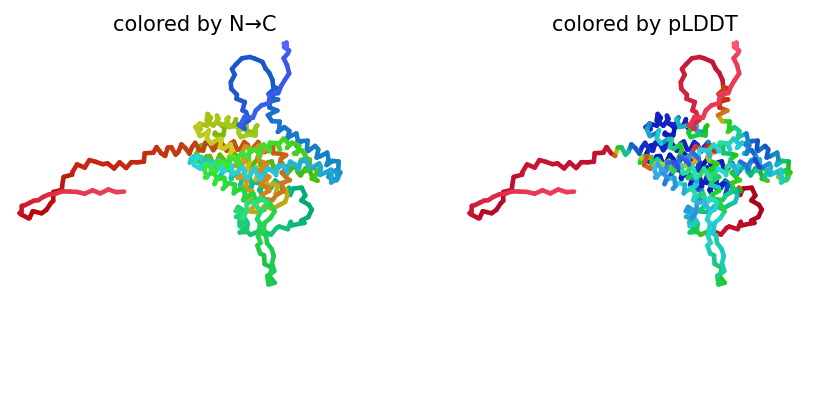

2023-11-09 07:55:31,262 alphafold2_ptm_model_3_seed_011 recycle=0 pLDDT=70.9 pTM=0.69
2023-11-09 07:55:37,068 alphafold2_ptm_model_3_seed_011 recycle=1 pLDDT=74.8 pTM=0.725 tol=3.02
2023-11-09 07:55:42,940 alphafold2_ptm_model_3_seed_011 recycle=2 pLDDT=75.1 pTM=0.725 tol=2.01
2023-11-09 07:55:48,742 alphafold2_ptm_model_3_seed_011 recycle=3 pLDDT=75.1 pTM=0.726 tol=1.19
2023-11-09 07:55:48,743 alphafold2_ptm_model_3_seed_011 took 23.3s (3 recycles)


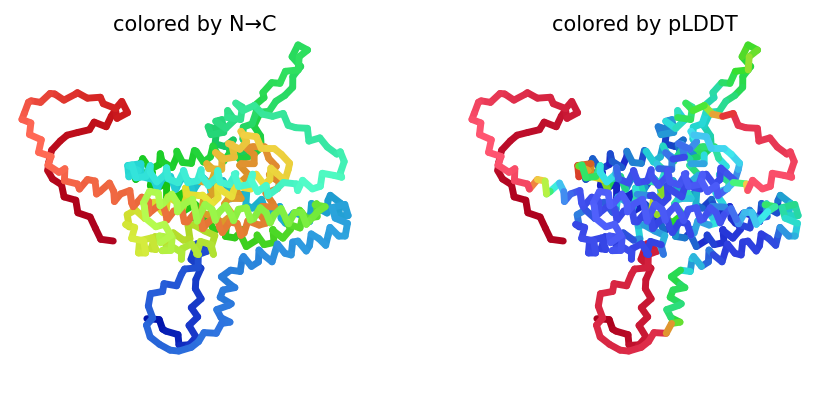

2023-11-09 07:55:55,179 alphafold2_ptm_model_4_seed_011 recycle=0 pLDDT=68.6 pTM=0.64
2023-11-09 07:56:01,001 alphafold2_ptm_model_4_seed_011 recycle=1 pLDDT=74.9 pTM=0.741 tol=3.37
2023-11-09 07:56:06,841 alphafold2_ptm_model_4_seed_011 recycle=2 pLDDT=73.8 pTM=0.726 tol=2.29
2023-11-09 07:56:12,685 alphafold2_ptm_model_4_seed_011 recycle=3 pLDDT=75.4 pTM=0.742 tol=2.06
2023-11-09 07:56:12,686 alphafold2_ptm_model_4_seed_011 took 23.4s (3 recycles)


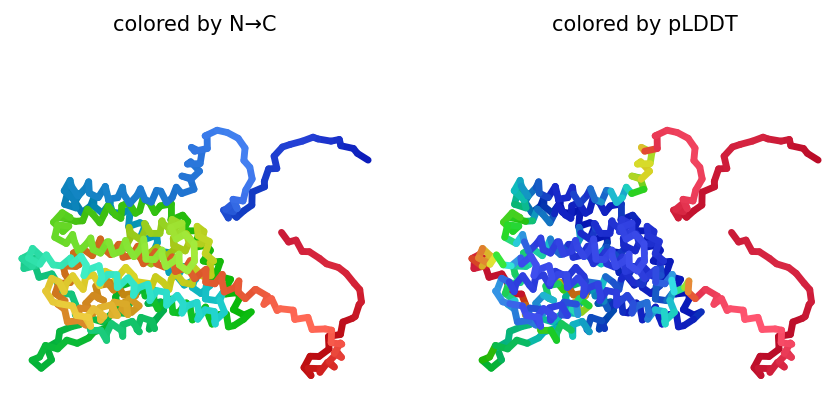

2023-11-09 07:56:19,146 alphafold2_ptm_model_5_seed_011 recycle=0 pLDDT=72.2 pTM=0.708
2023-11-09 07:56:25,027 alphafold2_ptm_model_5_seed_011 recycle=1 pLDDT=76.1 pTM=0.761 tol=4.24
2023-11-09 07:56:30,909 alphafold2_ptm_model_5_seed_011 recycle=2 pLDDT=74.3 pTM=0.744 tol=3.43
2023-11-09 07:56:36,756 alphafold2_ptm_model_5_seed_011 recycle=3 pLDDT=75.4 pTM=0.754 tol=2.45
2023-11-09 07:56:36,757 alphafold2_ptm_model_5_seed_011 took 23.5s (3 recycles)


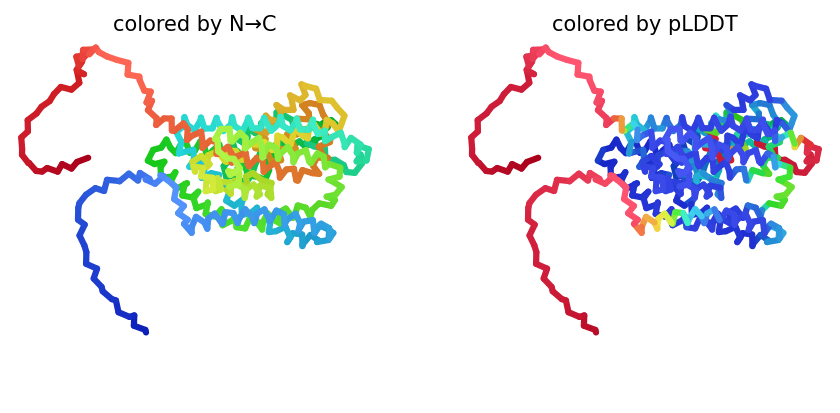

2023-11-09 07:56:46,973 alphafold2_ptm_model_1_seed_012 recycle=0 pLDDT=70.7 pTM=0.678
2023-11-09 07:56:52,784 alphafold2_ptm_model_1_seed_012 recycle=1 pLDDT=70.8 pTM=0.688 tol=4.33
2023-11-09 07:56:58,563 alphafold2_ptm_model_1_seed_012 recycle=2 pLDDT=70.1 pTM=0.663 tol=3.19
2023-11-09 07:57:04,383 alphafold2_ptm_model_1_seed_012 recycle=3 pLDDT=68.4 pTM=0.633 tol=2.34
2023-11-09 07:57:04,384 alphafold2_ptm_model_1_seed_012 took 23.3s (3 recycles)


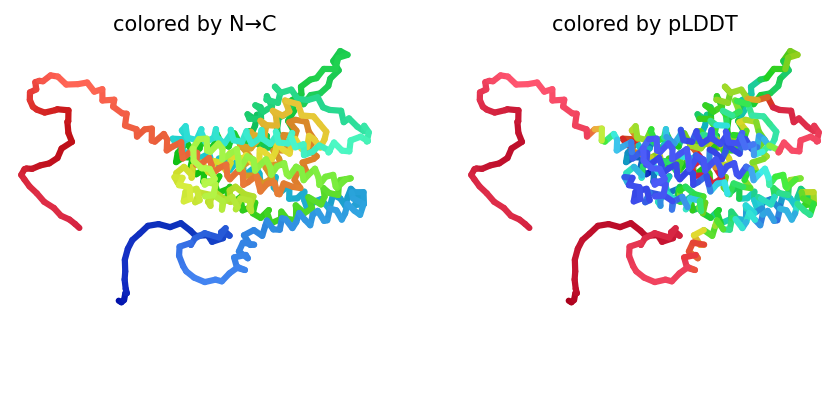

2023-11-09 07:57:10,840 alphafold2_ptm_model_2_seed_012 recycle=0 pLDDT=70.8 pTM=0.702
2023-11-09 07:57:16,628 alphafold2_ptm_model_2_seed_012 recycle=1 pLDDT=69.8 pTM=0.67 tol=6.2
2023-11-09 07:57:22,479 alphafold2_ptm_model_2_seed_012 recycle=2 pLDDT=69.3 pTM=0.665 tol=4.67
2023-11-09 07:57:28,275 alphafold2_ptm_model_2_seed_012 recycle=3 pLDDT=68.1 pTM=0.638 tol=1.68
2023-11-09 07:57:28,276 alphafold2_ptm_model_2_seed_012 took 23.3s (3 recycles)


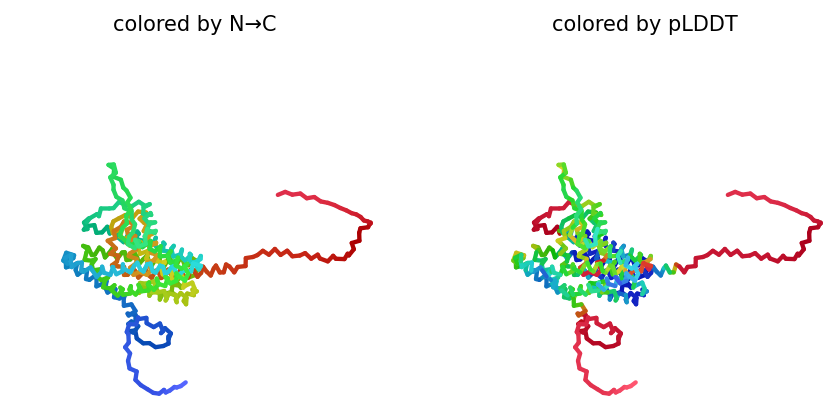

2023-11-09 07:57:34,750 alphafold2_ptm_model_3_seed_012 recycle=0 pLDDT=72.6 pTM=0.691
2023-11-09 07:57:40,602 alphafold2_ptm_model_3_seed_012 recycle=1 pLDDT=72.6 pTM=0.683 tol=4.57
2023-11-09 07:57:46,407 alphafold2_ptm_model_3_seed_012 recycle=2 pLDDT=72.8 pTM=0.671 tol=2.32
2023-11-09 07:57:52,272 alphafold2_ptm_model_3_seed_012 recycle=3 pLDDT=73.3 pTM=0.662 tol=2.23
2023-11-09 07:57:52,274 alphafold2_ptm_model_3_seed_012 took 23.4s (3 recycles)


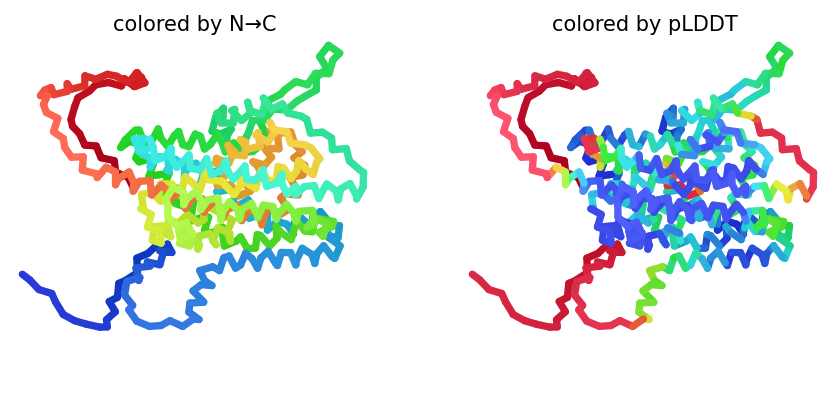

2023-11-09 07:57:58,737 alphafold2_ptm_model_4_seed_012 recycle=0 pLDDT=68.4 pTM=0.648
2023-11-09 07:58:04,536 alphafold2_ptm_model_4_seed_012 recycle=1 pLDDT=71.1 pTM=0.691 tol=4.57
2023-11-09 07:58:10,404 alphafold2_ptm_model_4_seed_012 recycle=2 pLDDT=75.2 pTM=0.749 tol=2.47
2023-11-09 07:58:16,226 alphafold2_ptm_model_4_seed_012 recycle=3 pLDDT=75.2 pTM=0.748 tol=1.16
2023-11-09 07:58:16,228 alphafold2_ptm_model_4_seed_012 took 23.3s (3 recycles)


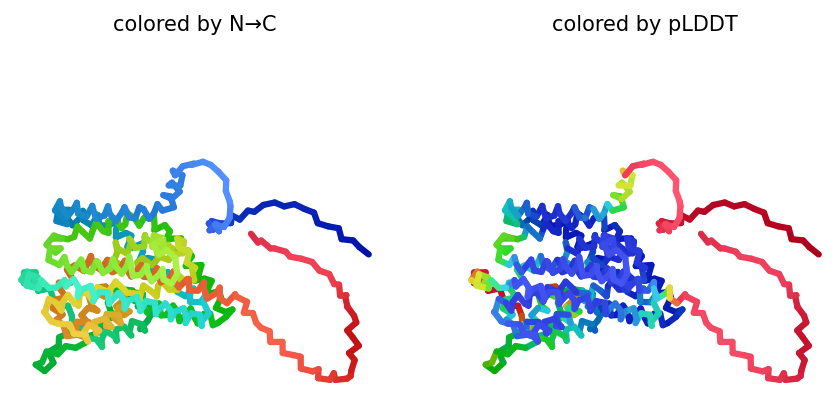

2023-11-09 07:58:22,688 alphafold2_ptm_model_5_seed_012 recycle=0 pLDDT=68.2 pTM=0.642
2023-11-09 07:58:28,554 alphafold2_ptm_model_5_seed_012 recycle=1 pLDDT=72.5 pTM=0.701 tol=9.8
2023-11-09 07:58:34,393 alphafold2_ptm_model_5_seed_012 recycle=2 pLDDT=75.5 pTM=0.756 tol=3.11
2023-11-09 07:58:40,296 alphafold2_ptm_model_5_seed_012 recycle=3 pLDDT=75.9 pTM=0.757 tol=1.9
2023-11-09 07:58:40,298 alphafold2_ptm_model_5_seed_012 took 23.5s (3 recycles)


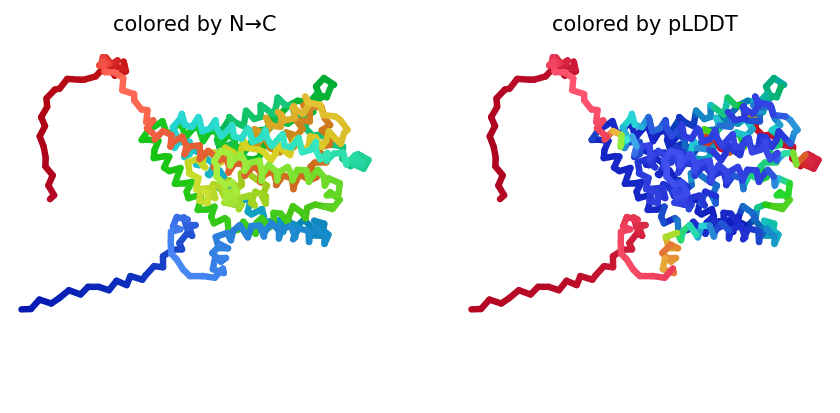

2023-11-09 07:58:50,662 alphafold2_ptm_model_1_seed_013 recycle=0 pLDDT=69.7 pTM=0.666
2023-11-09 07:58:56,501 alphafold2_ptm_model_1_seed_013 recycle=1 pLDDT=72.4 pTM=0.715 tol=2.65
2023-11-09 07:59:02,316 alphafold2_ptm_model_1_seed_013 recycle=2 pLDDT=70.7 pTM=0.681 tol=2.7
2023-11-09 07:59:08,142 alphafold2_ptm_model_1_seed_013 recycle=3 pLDDT=71.5 pTM=0.686 tol=4.62
2023-11-09 07:59:08,144 alphafold2_ptm_model_1_seed_013 took 23.3s (3 recycles)


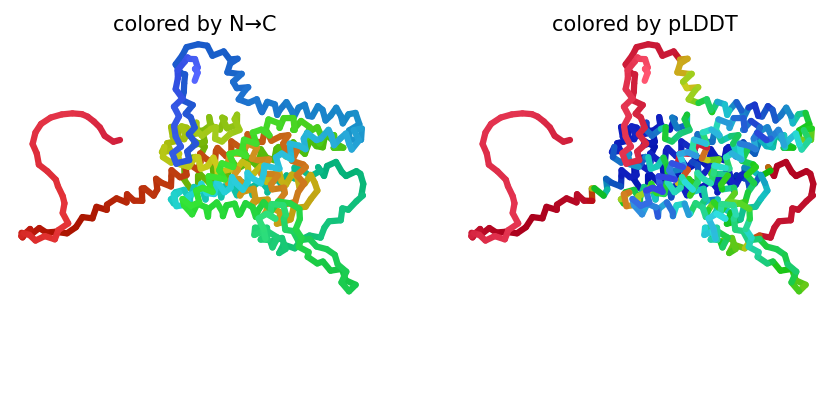

2023-11-09 07:59:14,582 alphafold2_ptm_model_2_seed_013 recycle=0 pLDDT=68.4 pTM=0.638
2023-11-09 07:59:20,432 alphafold2_ptm_model_2_seed_013 recycle=1 pLDDT=71.9 pTM=0.704 tol=4.17
2023-11-09 07:59:26,289 alphafold2_ptm_model_2_seed_013 recycle=2 pLDDT=71.6 pTM=0.699 tol=4.16
2023-11-09 07:59:32,142 alphafold2_ptm_model_2_seed_013 recycle=3 pLDDT=71.3 pTM=0.69 tol=1.97
2023-11-09 07:59:32,143 alphafold2_ptm_model_2_seed_013 took 23.4s (3 recycles)


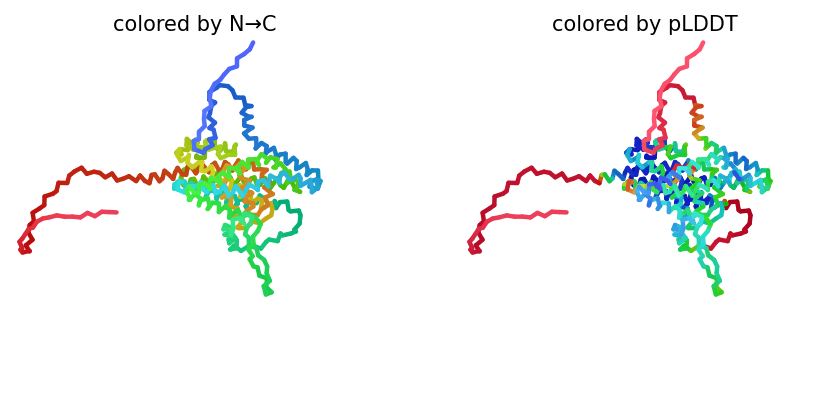

2023-11-09 07:59:38,596 alphafold2_ptm_model_3_seed_013 recycle=0 pLDDT=72.6 pTM=0.699
2023-11-09 07:59:44,467 alphafold2_ptm_model_3_seed_013 recycle=1 pLDDT=75.8 pTM=0.749 tol=3.58
2023-11-09 07:59:50,326 alphafold2_ptm_model_3_seed_013 recycle=2 pLDDT=75.7 pTM=0.731 tol=1.32
2023-11-09 07:59:56,200 alphafold2_ptm_model_3_seed_013 recycle=3 pLDDT=75.9 pTM=0.748 tol=0.582
2023-11-09 07:59:56,202 alphafold2_ptm_model_3_seed_013 took 23.5s (3 recycles)


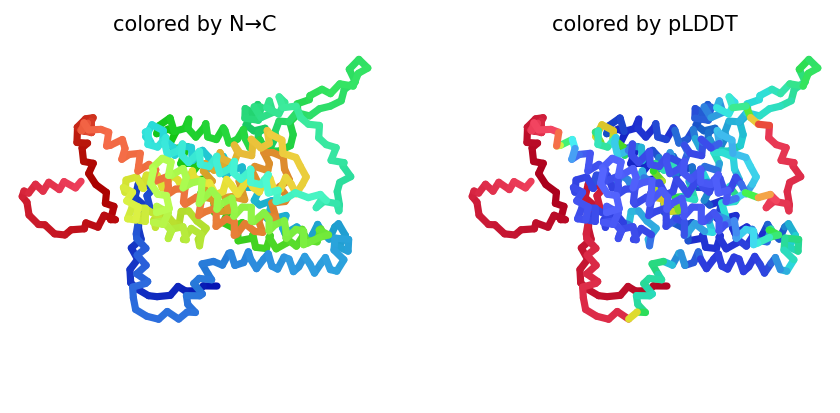

2023-11-09 08:00:02,671 alphafold2_ptm_model_4_seed_013 recycle=0 pLDDT=67.3 pTM=0.63
2023-11-09 08:00:08,528 alphafold2_ptm_model_4_seed_013 recycle=1 pLDDT=72.6 pTM=0.71 tol=3.96
2023-11-09 08:00:14,398 alphafold2_ptm_model_4_seed_013 recycle=2 pLDDT=75.5 pTM=0.747 tol=1.87
2023-11-09 08:00:20,281 alphafold2_ptm_model_4_seed_013 recycle=3 pLDDT=76.1 pTM=0.75 tol=0.84
2023-11-09 08:00:20,283 alphafold2_ptm_model_4_seed_013 took 23.5s (3 recycles)


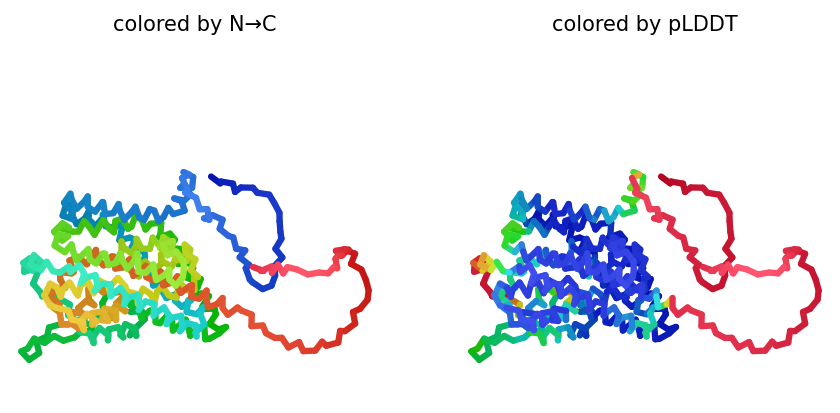

2023-11-09 08:00:26,748 alphafold2_ptm_model_5_seed_013 recycle=0 pLDDT=72.2 pTM=0.719
2023-11-09 08:00:32,689 alphafold2_ptm_model_5_seed_013 recycle=1 pLDDT=75.8 pTM=0.764 tol=3.63
2023-11-09 08:00:38,587 alphafold2_ptm_model_5_seed_013 recycle=2 pLDDT=75.5 pTM=0.754 tol=4.35
2023-11-09 08:00:44,489 alphafold2_ptm_model_5_seed_013 recycle=3 pLDDT=75.3 pTM=0.749 tol=1.45
2023-11-09 08:00:44,490 alphafold2_ptm_model_5_seed_013 took 23.6s (3 recycles)


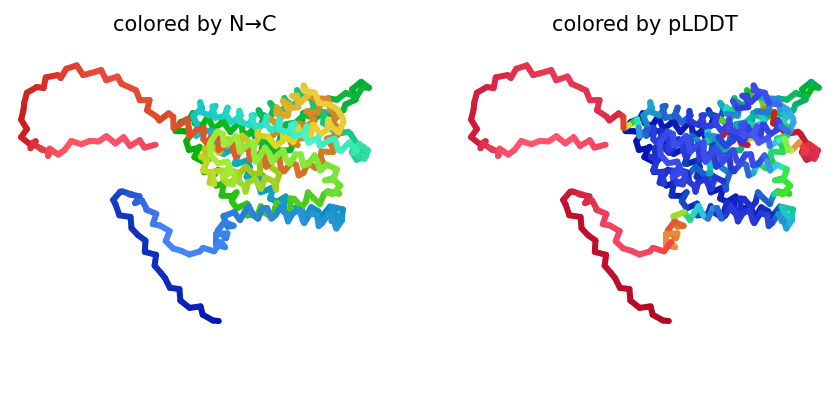

2023-11-09 08:00:55,129 alphafold2_ptm_model_1_seed_014 recycle=0 pLDDT=69.9 pTM=0.642
2023-11-09 08:01:00,926 alphafold2_ptm_model_1_seed_014 recycle=1 pLDDT=67.9 pTM=0.656 tol=3.93
2023-11-09 08:01:06,732 alphafold2_ptm_model_1_seed_014 recycle=2 pLDDT=68.4 pTM=0.638 tol=1.87
2023-11-09 08:01:12,546 alphafold2_ptm_model_1_seed_014 recycle=3 pLDDT=68.1 pTM=0.638 tol=1.71
2023-11-09 08:01:12,547 alphafold2_ptm_model_1_seed_014 took 23.3s (3 recycles)


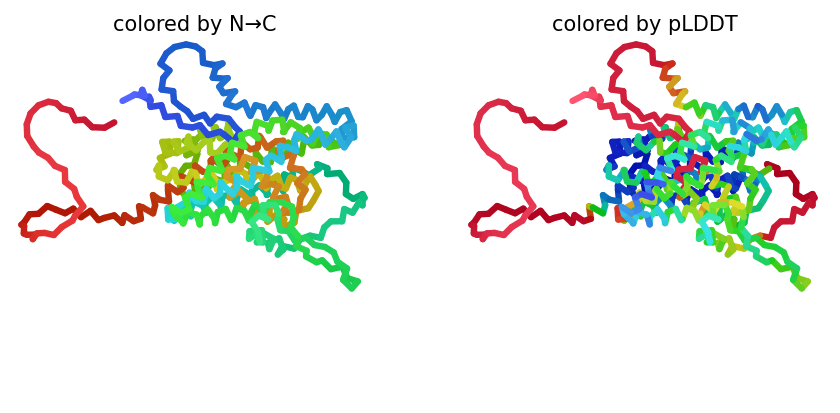

2023-11-09 08:01:18,990 alphafold2_ptm_model_2_seed_014 recycle=0 pLDDT=67.2 pTM=0.61
2023-11-09 08:01:24,827 alphafold2_ptm_model_2_seed_014 recycle=1 pLDDT=67.8 pTM=0.642 tol=4.79
2023-11-09 08:01:30,672 alphafold2_ptm_model_2_seed_014 recycle=2 pLDDT=69.1 pTM=0.644 tol=3.84
2023-11-09 08:01:36,519 alphafold2_ptm_model_2_seed_014 recycle=3 pLDDT=69.2 pTM=0.654 tol=1.86
2023-11-09 08:01:36,521 alphafold2_ptm_model_2_seed_014 took 23.4s (3 recycles)


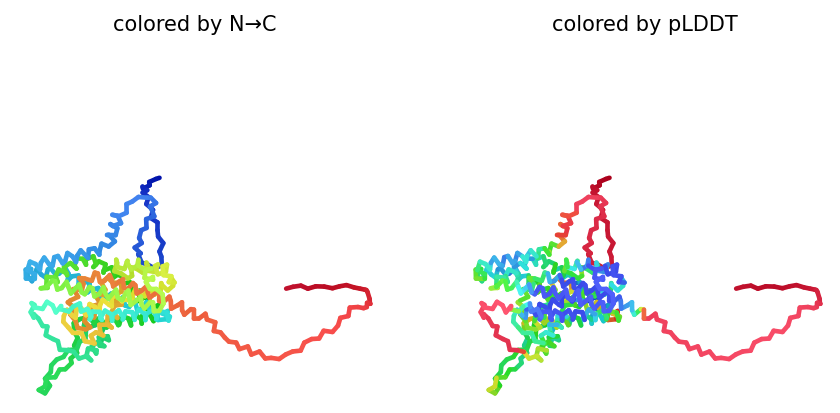

2023-11-09 08:01:42,965 alphafold2_ptm_model_3_seed_014 recycle=0 pLDDT=72.5 pTM=0.686
2023-11-09 08:01:48,834 alphafold2_ptm_model_3_seed_014 recycle=1 pLDDT=76.4 pTM=0.748 tol=2.92
2023-11-09 08:01:54,718 alphafold2_ptm_model_3_seed_014 recycle=2 pLDDT=77 pTM=0.752 tol=1.94
2023-11-09 08:02:00,618 alphafold2_ptm_model_3_seed_014 recycle=3 pLDDT=78.1 pTM=0.761 tol=1.77
2023-11-09 08:02:00,619 alphafold2_ptm_model_3_seed_014 took 23.5s (3 recycles)


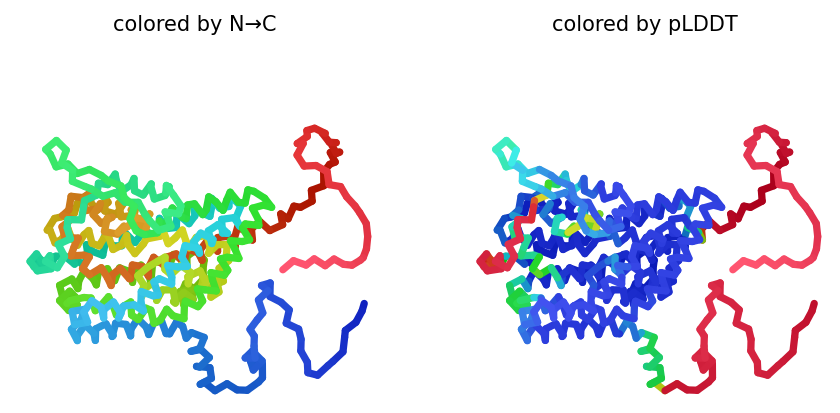

2023-11-09 08:02:07,073 alphafold2_ptm_model_4_seed_014 recycle=0 pLDDT=71.6 pTM=0.696
2023-11-09 08:02:12,925 alphafold2_ptm_model_4_seed_014 recycle=1 pLDDT=74.3 pTM=0.739 tol=2.23
2023-11-09 08:02:18,782 alphafold2_ptm_model_4_seed_014 recycle=2 pLDDT=74.4 pTM=0.737 tol=1.38
2023-11-09 08:02:24,637 alphafold2_ptm_model_4_seed_014 recycle=3 pLDDT=75 pTM=0.741 tol=1.22
2023-11-09 08:02:24,638 alphafold2_ptm_model_4_seed_014 took 23.4s (3 recycles)


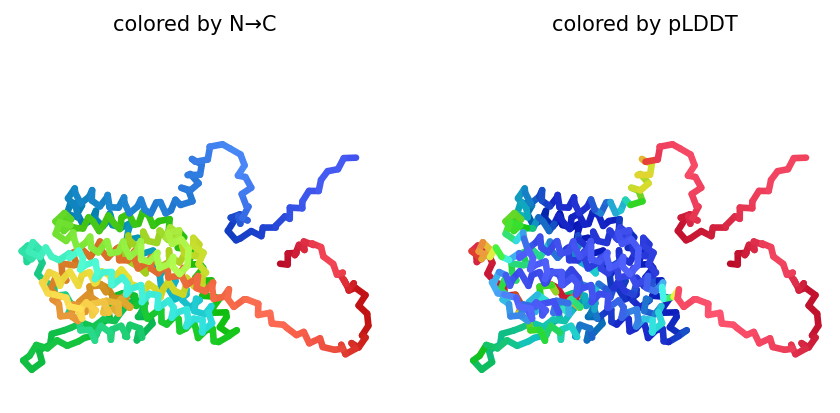

2023-11-09 08:02:31,130 alphafold2_ptm_model_5_seed_014 recycle=0 pLDDT=72.4 pTM=0.709
2023-11-09 08:02:37,000 alphafold2_ptm_model_5_seed_014 recycle=1 pLDDT=75.3 pTM=0.751 tol=2.85
2023-11-09 08:02:42,914 alphafold2_ptm_model_5_seed_014 recycle=2 pLDDT=76.2 pTM=0.76 tol=1.87
2023-11-09 08:02:48,812 alphafold2_ptm_model_5_seed_014 recycle=3 pLDDT=76.2 pTM=0.756 tol=2.04
2023-11-09 08:02:48,813 alphafold2_ptm_model_5_seed_014 took 23.5s (3 recycles)


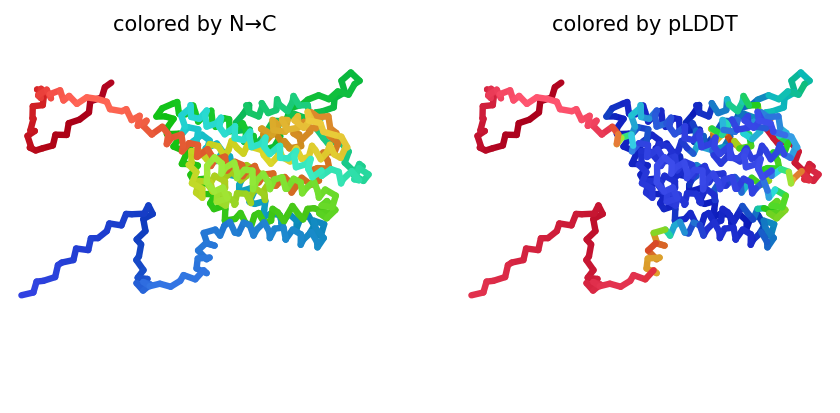

2023-11-09 08:02:59,071 alphafold2_ptm_model_1_seed_015 recycle=0 pLDDT=67.6 pTM=0.607
2023-11-09 08:03:04,879 alphafold2_ptm_model_1_seed_015 recycle=1 pLDDT=68.2 pTM=0.65 tol=4.21
2023-11-09 08:03:10,693 alphafold2_ptm_model_1_seed_015 recycle=2 pLDDT=68.2 pTM=0.639 tol=2.47
2023-11-09 08:03:16,511 alphafold2_ptm_model_1_seed_015 recycle=3 pLDDT=69.3 pTM=0.641 tol=1.71
2023-11-09 08:03:16,512 alphafold2_ptm_model_1_seed_015 took 23.3s (3 recycles)


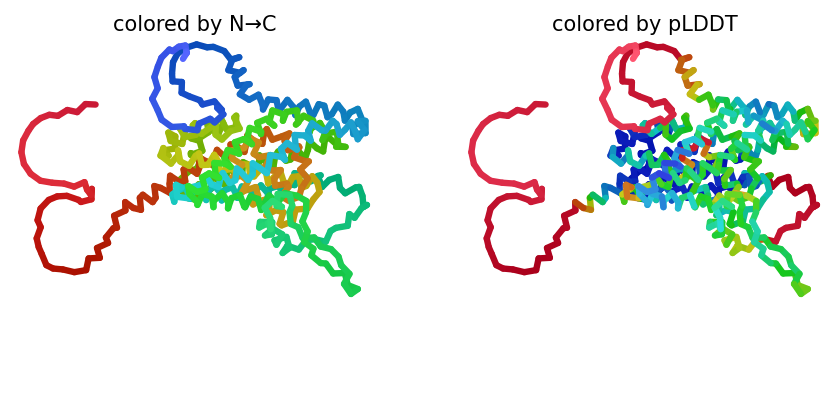

2023-11-09 08:03:22,968 alphafold2_ptm_model_2_seed_015 recycle=0 pLDDT=70.5 pTM=0.678
2023-11-09 08:03:28,813 alphafold2_ptm_model_2_seed_015 recycle=1 pLDDT=71 pTM=0.691 tol=3.44
2023-11-09 08:03:34,660 alphafold2_ptm_model_2_seed_015 recycle=2 pLDDT=70.8 pTM=0.684 tol=4.58
2023-11-09 08:03:40,505 alphafold2_ptm_model_2_seed_015 recycle=3 pLDDT=70.9 pTM=0.677 tol=2.72
2023-11-09 08:03:40,507 alphafold2_ptm_model_2_seed_015 took 23.4s (3 recycles)


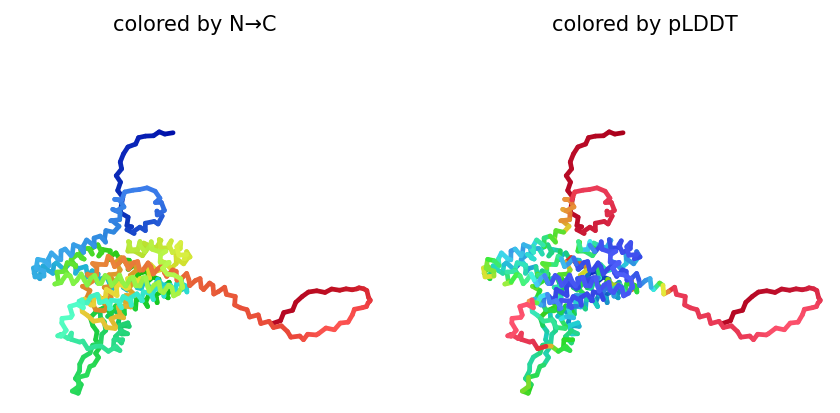

2023-11-09 08:03:46,955 alphafold2_ptm_model_3_seed_015 recycle=0 pLDDT=72.4 pTM=0.692
2023-11-09 08:03:52,862 alphafold2_ptm_model_3_seed_015 recycle=1 pLDDT=77.1 pTM=0.756 tol=2.52
2023-11-09 08:03:58,754 alphafold2_ptm_model_3_seed_015 recycle=2 pLDDT=77.8 pTM=0.757 tol=2.08
2023-11-09 08:04:04,660 alphafold2_ptm_model_3_seed_015 recycle=3 pLDDT=78.5 pTM=0.759 tol=1.34
2023-11-09 08:04:04,661 alphafold2_ptm_model_3_seed_015 took 23.6s (3 recycles)


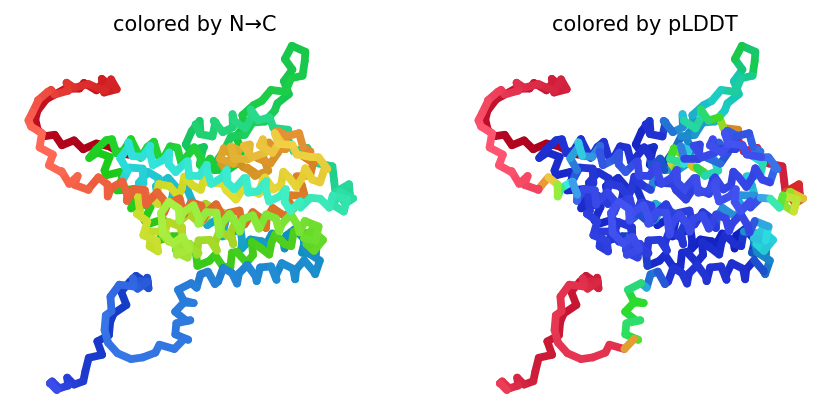

2023-11-09 08:04:11,127 alphafold2_ptm_model_4_seed_015 recycle=0 pLDDT=68.9 pTM=0.634
2023-11-09 08:04:16,974 alphafold2_ptm_model_4_seed_015 recycle=1 pLDDT=72.4 pTM=0.716 tol=3.93
2023-11-09 08:04:22,837 alphafold2_ptm_model_4_seed_015 recycle=2 pLDDT=74.5 pTM=0.74 tol=1.79
2023-11-09 08:04:28,708 alphafold2_ptm_model_4_seed_015 recycle=3 pLDDT=75.6 pTM=0.743 tol=1.29
2023-11-09 08:04:28,710 alphafold2_ptm_model_4_seed_015 took 23.4s (3 recycles)


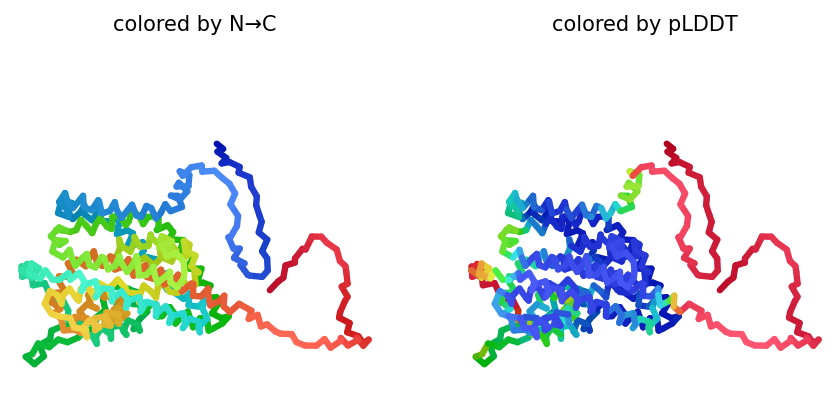

2023-11-09 08:04:35,198 alphafold2_ptm_model_5_seed_015 recycle=0 pLDDT=73.8 pTM=0.722
2023-11-09 08:04:41,104 alphafold2_ptm_model_5_seed_015 recycle=1 pLDDT=75.7 pTM=0.759 tol=3.08
2023-11-09 08:04:47,005 alphafold2_ptm_model_5_seed_015 recycle=2 pLDDT=75.1 pTM=0.756 tol=2.04
2023-11-09 08:04:52,918 alphafold2_ptm_model_5_seed_015 recycle=3 pLDDT=76 pTM=0.757 tol=1.81
2023-11-09 08:04:52,919 alphafold2_ptm_model_5_seed_015 took 23.6s (3 recycles)


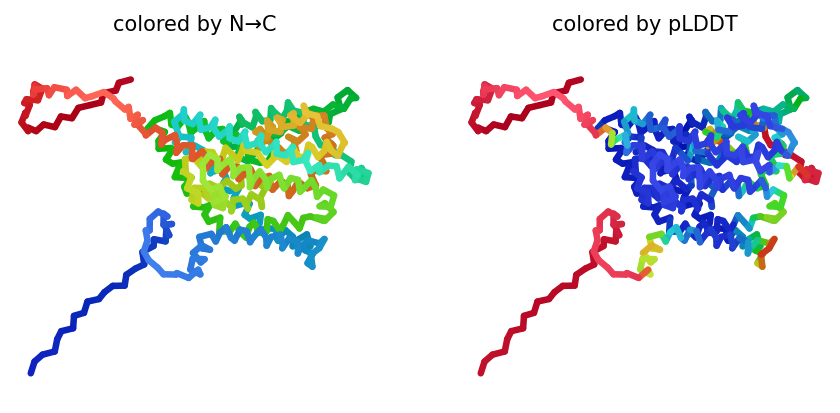

2023-11-09 08:04:53,506 reranking models by 'plddt' metric
2023-11-09 08:04:53,507 rank_001_alphafold2_ptm_model_3_seed_006 pLDDT=78.5 pTM=0.761
2023-11-09 08:04:53,508 rank_002_alphafold2_ptm_model_3_seed_015 pLDDT=78.5 pTM=0.759
2023-11-09 08:04:53,508 rank_003_alphafold2_ptm_model_3_seed_002 pLDDT=78.1 pTM=0.757
2023-11-09 08:04:53,509 rank_004_alphafold2_ptm_model_3_seed_010 pLDDT=78.1 pTM=0.759
2023-11-09 08:04:53,509 rank_005_alphafold2_ptm_model_3_seed_004 pLDDT=78.1 pTM=0.756
2023-11-09 08:04:53,509 rank_006_alphafold2_ptm_model_3_seed_014 pLDDT=78.1 pTM=0.761
2023-11-09 08:04:53,510 rank_007_alphafold2_ptm_model_3_seed_008 pLDDT=78.1 pTM=0.761
2023-11-09 08:04:53,510 rank_008_alphafold2_ptm_model_3_seed_001 pLDDT=77.6 pTM=0.761
2023-11-09 08:04:53,511 rank_009_alphafold2_ptm_model_3_seed_003 pLDDT=77.4 pTM=0.752
2023-11-09 08:04:53,511 rank_010_alphafold2_ptm_model_3_seed_009 pLDDT=77.1 pTM=0.747
2023-11-09 08:04:53,512 rank_011_alphafold2_ptm_model_5_seed_002 pLDDT=76.6 pTM=0

0

In [ ]:
#@title Run Prediction
display_images = True #@param {type:"boolean"}

import sys
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from Bio import BiopythonDeprecationWarning
warnings.simplefilter(action='ignore', category=BiopythonDeprecationWarning)
from pathlib import Path
from colabfold.download import download_alphafold_params, default_data_dir
from colabfold.utils import setup_logging
from colabfold.batch import get_queries, run, set_model_type
from colabfold.plot import plot_msa_v2

import os
import numpy as np
try:
  K80_chk = os.popen('nvidia-smi | grep "Tesla K80" | wc -l').read()
except:
  K80_chk = "0"
  pass
if "1" in K80_chk:
  print("WARNING: found GPU Tesla K80: limited to total length < 1000")
  if "TF_FORCE_UNIFIED_MEMORY" in os.environ:
    del os.environ["TF_FORCE_UNIFIED_MEMORY"]
  if "XLA_PYTHON_CLIENT_MEM_FRACTION" in os.environ:
    del os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"]

from colabfold.colabfold import plot_protein
from pathlib import Path
import matplotlib.pyplot as plt

# For some reason we need that to get pdbfixer to import
if use_amber and f"/usr/local/lib/python{python_version}/site-packages/" not in sys.path:
    sys.path.insert(0, f"/usr/local/lib/python{python_version}/site-packages/")

def input_features_callback(input_features):
  if display_images:
    plot_msa_v2(input_features)
    plt.show()
    plt.close()

def prediction_callback(protein_obj, length,
                        prediction_result, input_features, mode):
  model_name, relaxed = mode
  if not relaxed:
    if display_images:
      fig = plot_protein(protein_obj, Ls=length, dpi=150)
      plt.show()
      plt.close()

result_dir = jobname
log_filename = os.path.join(jobname,"log.txt")
if not os.path.isfile(log_filename) or 'logging_setup' not in globals():
  setup_logging(Path(log_filename))
  logging_setup = True

queries, is_complex = get_queries(queries_path)
model_type = set_model_type(is_complex, model_type)

if "multimer" in model_type and max_msa is not None:
  use_cluster_profile = False
else:
  use_cluster_profile = True

download_alphafold_params(model_type, Path("."))
results = run(
    queries=queries,
    result_dir=result_dir,
    use_templates=use_templates,
    custom_template_path=custom_template_path,
    num_relax=num_relax,
    msa_mode=msa_mode,
    model_type=model_type,
    num_models=5,
    num_recycles=num_recycles,
    relax_max_iterations=relax_max_iterations,
    recycle_early_stop_tolerance=recycle_early_stop_tolerance,
    num_seeds=num_seeds,
    use_dropout=use_dropout,
    model_order=[1,2,3,4,5],
    is_complex=is_complex,
    data_dir=Path("."),
    keep_existing_results=False,
    rank_by="auto",
    pair_mode=pair_mode,
    pairing_strategy=pairing_strategy,
    stop_at_score=float(100),
    prediction_callback=prediction_callback,
    dpi=dpi,
    zip_results=False,
    save_all=save_all,
    max_msa=max_msa,
    use_cluster_profile=use_cluster_profile,
    input_features_callback=input_features_callback,
    save_recycles=save_recycles,
    user_agent="colabfold/google-colab-main",
)
results_zip = f"{jobname}.result.zip"
os.system(f"zip -r {results_zip} {jobname}")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

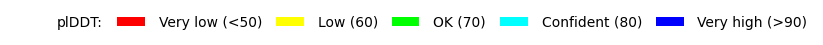

In [ ]:
#@title Display 3D structure {run: "auto"}
import py3Dmol
import glob
import matplotlib.pyplot as plt
from colabfold.colabfold import plot_plddt_legend
from colabfold.colabfold import pymol_color_list, alphabet_list
rank_num = 1 #@param ["1", "2", "3", "4", "5"] {type:"raw"}
color = "lDDT" #@param ["chain", "lDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = False #@param {type:"boolean"}

tag = results["rank"][0][rank_num - 1]
jobname_prefix = ".custom" if msa_mode == "custom" else ""
pdb_filename = f"{jobname}/{jobname}{jobname_prefix}_unrelaxed_{tag}.pdb"
pdb_file = glob.glob(pdb_filename)

def show_pdb(rank_num=1, show_sidechains=False, show_mainchains=False, color="lDDT"):
  model_name = f"rank_{rank_num}"
  view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js',)
  view.addModel(open(pdb_file[0],'r').read(),'pdb')

  if color == "lDDT":
    view.setStyle({'cartoon': {'colorscheme': {'prop':'b','gradient': 'roygb','min':50,'max':90}}})
  elif color == "rainbow":
    view.setStyle({'cartoon': {'color':'spectrum'}})
  elif color == "chain":
    chains = len(queries[0][1]) + 1 if is_complex else 1
    for n,chain,color in zip(range(chains),alphabet_list,pymol_color_list):
       view.setStyle({'chain':chain},{'cartoon': {'color':color}})

  if show_sidechains:
    BB = ['C','O','N']
    view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"GLY"},{'atom':'CA'}]},
                        {'sphere':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"PRO"},{'atom':['C','O'],'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
  if show_mainchains:
    BB = ['C','O','N','CA']
    view.addStyle({'atom':BB},{'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

  view.zoomTo()
  return view

show_pdb(rank_num, show_sidechains, show_mainchains, color).show()
if color == "lDDT":
  plot_plddt_legend().show()


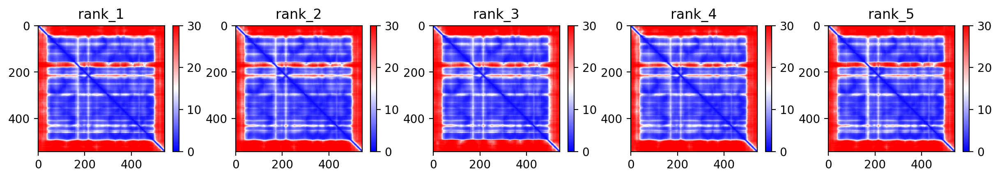
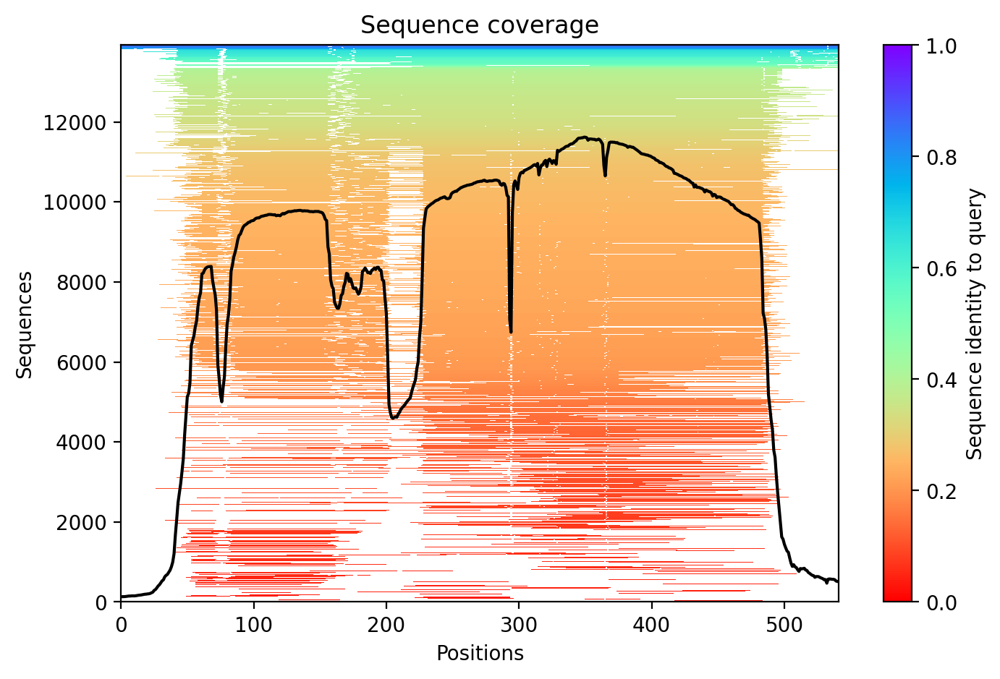
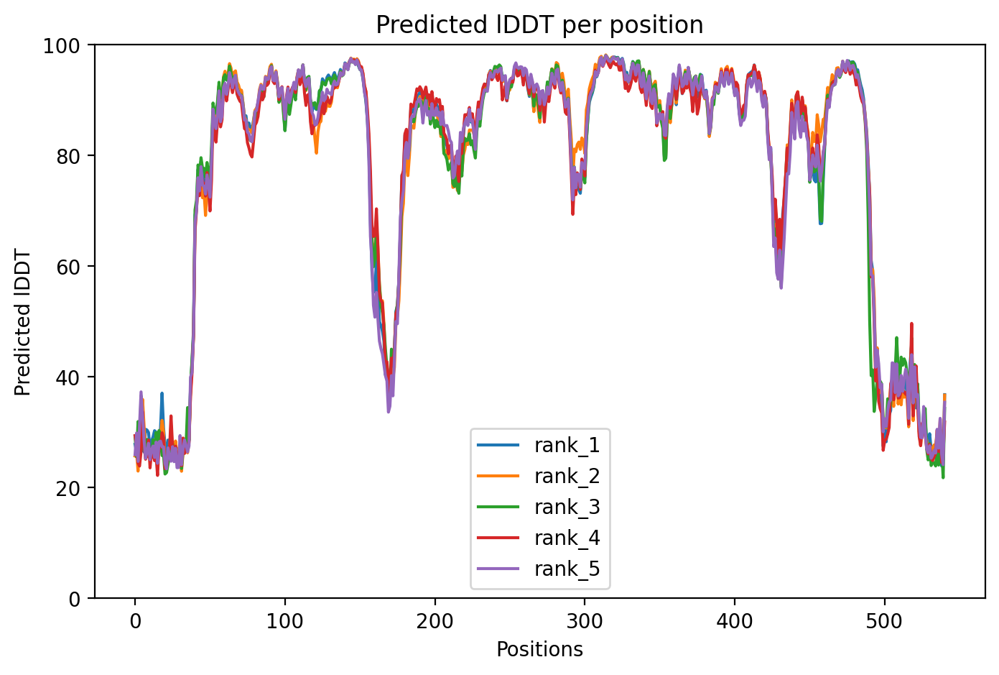

In [ ]:
#@title Plots {run: "auto"}
from IPython.display import display, HTML
import base64
from html import escape

# see: https://stackoverflow.com/a/53688522
def image_to_data_url(filename):
  ext = filename.split('.')[-1]
  prefix = f'data:image/{ext};base64,'
  with open(filename, 'rb') as f:
    img = f.read()
  return prefix + base64.b64encode(img).decode('utf-8')

pae = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_pae.png"))
cov = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_coverage.png"))
plddt = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_plddt.png"))
display(HTML(f"""
<style>
  img {{
    float:left;
  }}
  .full {{
    max-width:100%;
  }}
  .half {{
    max-width:50%;
  }}
  @media (max-width:640px) {{
    .half {{
      max-width:100%;
    }}
  }}
</style>
<div style="max-width:90%; padding:2em;">
  <h1>Plots for {escape(jobname)}</h1>
  <img src="{pae}" class="full" />
  <img src="{cov}" class="half" />
  <img src="{plddt}" class="half" />
</div>
"""))


In [ ]:
#@title Package and download results
#@markdown If you are having issues downloading the result archive, try disabling your adblocker and run this cell again. If that fails click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

if msa_mode == "custom":
  print("Don't forget to cite your custom MSA generation method.")

files.download(f"{jobname}.result.zip")

if save_to_google_drive == True and drive:
  uploaded = drive.CreateFile({'title': f"{jobname}.result.zip"})
  uploaded.SetContentFile(f"{jobname}.result.zip")
  uploaded.Upload()
  print(f"Uploaded {jobname}.result.zip to Google Drive with ID {uploaded.get('id')}")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Instructions <a name="Instructions"></a>
**Quick start**
1. Paste your protein sequence(s) in the input field.
2. Press "Runtime" -> "Run all".
3. The pipeline consists of 5 steps. The currently running step is indicated by a circle with a stop sign next to it.

**Result zip file contents**

1. PDB formatted structures sorted by avg. pLDDT and complexes are sorted by pTMscore. (unrelaxed and relaxed if `use_amber` is enabled).
2. Plots of the model quality.
3. Plots of the MSA coverage.
4. Parameter log file.
5. A3M formatted input MSA.
6. A `predicted_aligned_error_v1.json` using [AlphaFold-DB's format](https://alphafold.ebi.ac.uk/faq#faq-7) and a `scores.json` for each model which contains an array (list of lists) for PAE, a list with the average pLDDT and the pTMscore.
7. BibTeX file with citations for all used tools and databases.

At the end of the job a download modal box will pop up with a `jobname.result.zip` file. Additionally, if the `save_to_google_drive` option was selected, the `jobname.result.zip` will be uploaded to your Google Drive.

**MSA generation for complexes**

For the complex prediction we use unpaired and paired MSAs. Unpaired MSA is generated the same way as for the protein structures prediction by searching the UniRef100 and environmental sequences three iterations each.

The paired MSA is generated by searching the UniRef100 database and pairing the best hits sharing the same NCBI taxonomic identifier (=species or sub-species). We only pair sequences if all of the query sequences are present for the respective taxonomic identifier.

**Using a custom MSA as input**

To predict the structure with a custom MSA (A3M formatted): (1) Change the `msa_mode`: to "custom", (2) Wait for an upload box to appear at the end of the "MSA options ..." box. Upload your A3M. The first fasta entry of the A3M must be the query sequence without gaps.

It is also possilbe to proide custom MSAs for complex predictions. Read more about the format [here](https://github.com/sokrypton/ColabFold/issues/76).

As an alternative for MSA generation the [HHblits Toolkit server](https://toolkit.tuebingen.mpg.de/tools/hhblits) can be used. After submitting your query, click "Query Template MSA" -> "Download Full A3M". Download the A3M file and upload it in this notebook.

**PDB100** <a name="pdb100"></a>

As of 23/06/08, we have transitioned from using the PDB70 to a 100% clustered PDB, the PDB100. The construction methodology of PDB100 differs from that of PDB70.

The PDB70 was constructed by running each PDB70 representative sequence through [HHblits](https://github.com/soedinglab/hh-suite) against the [Uniclust30](https://uniclust.mmseqs.com/). On the other hand, the PDB100 is built by searching each PDB100 representative structure with [Foldseek](https://github.com/steineggerlab/foldseek) against the [AlphaFold Database](https://alphafold.ebi.ac.uk).

To maintain compatibility with older Notebook versions and local installations, the generated files and API responses will continue to be named "PDB70", even though we're now using the PDB100.

**Using custom templates** <a name="custom_templates"></a>

To predict the structure with a custom template (PDB or mmCIF formatted): (1) change the `template_mode` to "custom" in the execute cell and (2) wait for an upload box to appear at the end of the "Input Protein" box. Select and upload your templates (multiple choices are possible).

* Templates must follow the four letter PDB naming with lower case letters.

* Templates in mmCIF format must contain `_entity_poly_seq`. An error is thrown if this field is not present. The field `_pdbx_audit_revision_history.revision_date` is automatically generated if it is not present.

* Templates in PDB format are automatically converted to the mmCIF format. `_entity_poly_seq` and `_pdbx_audit_revision_history.revision_date` are automatically generated.

If you encounter problems, please report them to this [issue](https://github.com/sokrypton/ColabFold/issues/177).

**Comparison to the full AlphaFold2 and AlphaFold2 Colab**

This notebook replaces the homology detection and MSA pairing of AlphaFold2 with MMseqs2. For a comparison against the [AlphaFold2 Colab](https://colab.research.google.com/github/deepmind/alphafold/blob/main/notebooks/AlphaFold.ipynb) and the full [AlphaFold2](https://github.com/deepmind/alphafold) system read our [paper](https://www.nature.com/articles/s41592-022-01488-1).

**Troubleshooting**
* Check that the runtime type is set to GPU at "Runtime" -> "Change runtime type".
* Try to restart the session "Runtime" -> "Factory reset runtime".
* Check your input sequence.

**Known issues**
* Google Colab assigns different types of GPUs with varying amount of memory. Some might not have enough memory to predict the structure for a long sequence.
* Your browser can block the pop-up for downloading the result file. You can choose the `save_to_google_drive` option to upload to Google Drive instead or manually download the result file: Click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

**Limitations**
* Computing resources: Our MMseqs2 API can handle ~20-50k requests per day.
* MSAs: MMseqs2 is very precise and sensitive but might find less hits compared to HHblits/HMMer searched against BFD or MGnify.
* We recommend to additionally use the full [AlphaFold2 pipeline](https://github.com/deepmind/alphafold).

**Description of the plots**
*   **Number of sequences per position** - We want to see at least 30 sequences per position, for best performance, ideally 100 sequences.
*   **Predicted lDDT per position** - model confidence (out of 100) at each position. The higher the better.
*   **Predicted Alignment Error** - For homooligomers, this could be a useful metric to assess how confident the model is about the interface. The lower the better.

**Bugs**
- If you encounter any bugs, please report the issue to https://github.com/sokrypton/ColabFold/issues

**License**

The source code of ColabFold is licensed under [MIT](https://raw.githubusercontent.com/sokrypton/ColabFold/main/LICENSE). Additionally, this notebook uses the AlphaFold2 source code and its parameters licensed under [Apache 2.0](https://raw.githubusercontent.com/deepmind/alphafold/main/LICENSE) and [CC BY 4.0](https://creativecommons.org/licenses/by-sa/4.0/) respectively. Read more about the AlphaFold license [here](https://github.com/deepmind/alphafold).

**Acknowledgments**
- We thank the AlphaFold team for developing an excellent model and open sourcing the software.

- [KOBIC](https://kobic.re.kr) and [Söding Lab](https://www.mpinat.mpg.de/soeding) for providing the computational resources for the MMseqs2 MSA server.

- Richard Evans for helping to benchmark the ColabFold's Alphafold-multimer support.

- [David Koes](https://github.com/dkoes) for his awesome [py3Dmol](https://3dmol.csb.pitt.edu/) plugin, without whom these notebooks would be quite boring!

- Do-Yoon Kim for creating the ColabFold logo.

- A colab by Sergey Ovchinnikov ([@sokrypton](https://twitter.com/sokrypton)), Milot Mirdita ([@milot_mirdita](https://twitter.com/milot_mirdita)) and Martin Steinegger ([@thesteinegger](https://twitter.com/thesteinegger)).
